In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import descartes

import geopandas as gpd

from shapely.geometry import Point, Polygon
from shapely.geometry.multipolygon import MultiPolygon

from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import geoplot as gplt
import geoplot.crs as gcrs
import matplotlib.pyplot as plt

In [8]:
%matplotlib inline

Карта по районам

In [4]:
# russia_map = gpd.read_file('draw_picture/RUS_adm/RUS_adm3.shp')
# fig,ax = plt.subplots(figsize = (15,15))
# russia_map.plot(ax = ax)

Карта по регионам

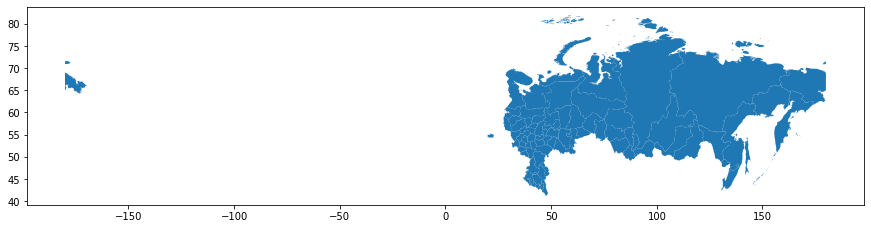

In [15]:
russia_map = gpd.read_file('draw_points/RUS_adm/RUS_adm1.shp')
fig,ax = plt.subplots(figsize = (15,15))
russia_map.plot(ax = ax);

In [19]:
# russia_map.geometry.apply(type).unique()
mp = MultiPolygon([russia_map.geometry[0], russia_map.geometry[1]])
# print(mp, type(mp))

In [20]:
def rectify_poly(p):
    pts = p.exterior.coords[:]
    def angle_corr(angle):
        return angle + 360 if angle < 0 else angle
    pts2 = [(angle_corr(pp[0]), angle_corr(pp[1])) for pp in pts]    
    return Polygon(pts2)

def rectify_multipoly(mp):
    if type(mp) == Polygon:
        return rectify_poly(mp)
    elif type(mp) == MultiPolygon:
        return MultiPolygon([rectify_poly(p) for p in mp])
    
new_geom = russia_map.geometry.apply(rectify_multipoly)

/tmp/ipykernel_243929/914783897.py:12: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  return MultiPolygon([rectify_poly(p) for p in mp])


In [21]:
russia_map2 = russia_map.copy()
russia_map2.geometry = new_geom
crimea_map = gpd.read_file('draw_points/crimea_9sr/crimea_9sr.shp')

In [22]:
russia_with_crimea = russia_map2.append({'geometry': crimea_map.geometry[0],
                    'NAME_0': 'Russia', 'ISO': 'RUS',
                    'NAME_1': 'Crimea', 'TYPE_1': 'Respublika',
                    'ENGTYPE_1': 'Republic', 'NL_NAME_1':'Республика Крым',
                    'VARNAME_1': 'Crimea', 'ID_0':188, 'ID_1':91}, ignore_index=True)

/tmp/ipykernel_243929/369138696.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  russia_with_crimea = russia_map2.append({'geometry': crimea_map.geometry[0],


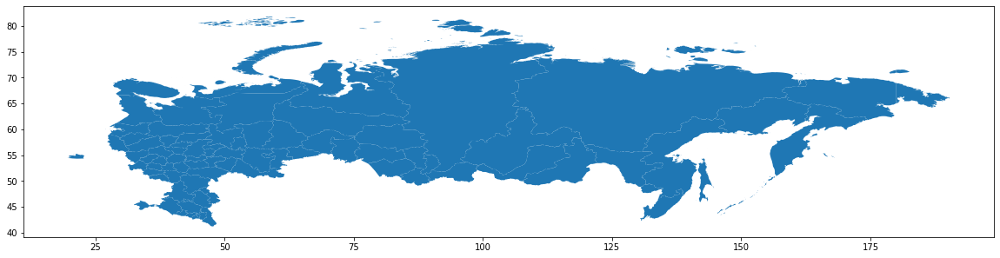

In [23]:
fig,ax = plt.subplots(figsize = (20,20))
russia_with_crimea.plot(ax = ax);

In [24]:
russia_with_crimea.head()

,ID_0,ISO,NAME_0,ID_1,NAME_1,TYPE_1,ENGTYPE_1,NL_NAME_1,VARNAME_1,geometry
0,188,RUS,Russia,1,Adygey,Respublika,Republic,Республика Адыгея,Adygea|Adygeya|Adygheya|Republic of Adygeya|Ad...,"POLYGON ((39.64795 45.16420, 39.68002 45.15558..."
1,188,RUS,Russia,2,Altay,Kray,Territory,Алтайский край,Altayskiy Kray,"POLYGON ((85.36115 54.22598, 85.39015 54.19637..."
2,188,RUS,Russia,3,Amur,Oblast,Region,Амурская область,Amurskaya Oblast,"POLYGON ((120.67429 57.05607, 120.73457 57.040..."
3,188,RUS,Russia,4,Arkhangel'sk,Oblast,Region,Архангельская область,Arcangelo|Archangel|Archangelsk|Arkhangelskaya...,"MULTIPOLYGON (((36.77240 63.91510, 36.77083 63..."
4,188,RUS,Russia,5,Astrakhan',Oblast,Region,Астраханская область,Astrachan|Astrakhanskaya Oblast,"POLYGON ((46.58406 48.61551, 46.51928 48.49756..."


In [25]:
pdlist = pd.read_csv('map_reg_dict.csv', index_col=0)

In [26]:
russia_with_crimea.iloc[:,-3] =  pdlist.iloc[:,1]

In [27]:
type(russia_with_crimea)

geopandas.geodataframe.GeoDataFrame

### Preparing Dataset

In [11]:
glub_1 = pd.read_csv('../1_data_oil_indexes/1_glubina_regions.csv').iloc[7:,[0,2]]

In [12]:
glub_1.head()

,Unnamed: 0,"Глубина переработки, %"
7,Астраханская область,81.00
8,Волгоградская область,92.30
9,Иркутская область,76.47
10,Кемеровская область,58.10
11,Краснодарский край,57.55


In [81]:
maplist =  dor_5.index.values
rlist = all_data.iloc[:,1]

from fuzzywuzzy import fuzz

k = []
for i in maplist:
    lll = [fuzz.ratio(i,j) for j in rlist]
    k.append(np.argmax(lll))

rlist2 = rlist[k]

In [13]:
all_data = pd.read_csv('all_data_for_map.csv', index_col=0)

In [28]:
russia_data = russia_with_crimea.merge(all_data, how='outer', left_on='NL_NAME_1', right_on='1')

In [29]:
russia_data = russia_data.drop(['0.1', '1'], axis=1)

In [30]:
russia_data.head()

,ID_0,ISO,NAME_0,ID_1,NAME_1,TYPE_1,ENGTYPE_1,NL_NAME_1,VARNAME_1,geometry,...,Крэк-спред 2013,Крэк-спред 2018,Спарк-спред 2012,Спарк-спред 2018,Цены на мазут 2012,Цены на мазут 2018,Акцизы на нефтепродукты (факт. 2016 г. ),Акцизы на нефтепродукты (Прогноз 2017 г.),Цены на дизель 2013,Цены на дизель 2018
0,188,RUS,Russia,1,Adygey,Respublika,Republic,Республика Адыгея,Adygea|Adygeya|Adygheya|Republic of Adygeya|Ad...,"POLYGON ((39.64795 45.16420, 39.68002 45.15558...",...,NaN,NaN,NaN,NaN,NaN,NaN,1264.565387,917.613061,30.051979,42.721344
1,188,RUS,Russia,2,Altay,Kray,Territory,Алтайский край,Altayskiy Kray,"POLYGON ((85.36115 54.22598, 85.39015 54.19637...",...,NaN,NaN,NaN,NaN,NaN,NaN,7739.559943,5112.455074,31.287664,43.099740
2,188,RUS,Russia,3,Amur,Oblast,Region,Амурская область,Amurskaya Oblast,"POLYGON ((120.67429 57.05607, 120.73457 57.040...",...,NaN,NaN,2113.906667,3834.848333,NaN,NaN,2729.647219,1885.483593,34.625273,45.130495
3,188,RUS,Russia,4,Arkhangel'sk,Oblast,Region,Архангельская область,Arcangelo|Archangel|Archangelsk|Arkhangelskaya...,"MULTIPOLYGON (((36.77240 63.91510, 36.77083 63...",...,NaN,NaN,NaN,NaN,NaN,NaN,3207.138713,2367.623950,32.331774,43.854253
4,188,RUS,Russia,5,Astrakhan',Oblast,Region,Астраханская область,Astrachan|Astrakhanskaya Oblast,"POLYGON ((46.58406 48.61551, 46.51928 48.49756...",...,17357.12433,15436.016611,NaN,NaN,10047.040081,20188.726822,2117.978365,1477.624884,30.104089,41.087460


## Аналитические показатели для рынка нефти и нефтепродуктов

### [Глубина переработки](https://ru.wikipedia.org/wiki/%D0%93%D0%BB%D1%83%D0%B1%D0%B8%D0%BD%D0%B0_%D0%BF%D0%B5%D1%80%D0%B5%D1%80%D0%B0%D0%B1%D0%BE%D1%82%D0%BA%D0%B8_%D0%BD%D0%B5%D1%84%D1%82%D0%B8)

In [ ]:
russia_data_2 = russia_data.copy()

In [ ]:
viridis = cm.get_cmap('viridis', 256)
newcolors = viridis(np.linspace(1, 0, 256))
grey = np.array([192/256, 192/256, 192/256, 1])
newcolors[:1, :] = grey
newcmp = ListedColormap(newcolors)

In [40]:
russia_data_2['Глубина переработки, %']

0      49.6509
1      49.6509
2      49.6509
3      49.6509
4      81.0000
        ...   
79    100.0000
80     64.0500
81     49.6509
82     49.6509
83     49.6509
Name: Глубина переработки, %, Length: 84, dtype: float64

In [ ]:
russia_data_2

[working with projections](https://residentmario.github.io/geoplot/user_guide/Working_with_Projections.html)

/home/xenakas/.local/lib/python3.10/site-packages/geoplot/geoplot.py:56: UserWarning: The data being passed to "hue" includes null values. You probably want to remove these before plotting this data with geoplot.
  warnings.warn(


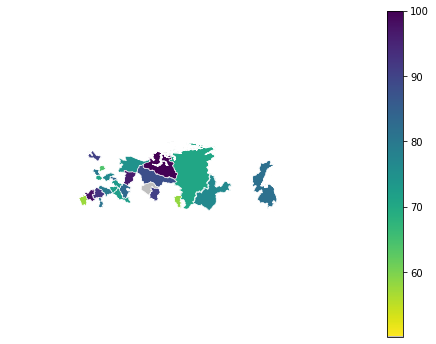

In [56]:
proj = gcrs.AlbersEqualArea(central_longitude=94, central_latitude=60)

gplt.choropleth(
    russia_data_2, hue='Глубина переработки, %',
    cmap=newcmp, linewidth=0.5, edgecolor='white', 
    legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [34]:
russia_data_2['Глубина переработки, %'][russia_data_2['Глубина переработки, %'] > 95]

54     96.4
57     97.8
79    100.0
Name: Глубина переработки, %, dtype: float64

In [35]:
russia_data_2['Глубина переработки, %'].mean()

78.43613333333333

In [36]:
russia_data_2['Глубина переработки, %'][russia_data_2['Глубина переработки, %'] < 60]

26    58.10
33    57.55
72    50.10
Name: Глубина переработки, %, dtype: float64

In [37]:
replce10 =  russia_data_2['Глубина переработки, %'].min() - (russia_data_2['Глубина переработки, %'].max() - russia_data_2['Глубина переработки, %'].min())*0.01 * 0.9
russia_data_2['Глубина переработки, %'] = russia_data_2['Глубина переработки, %'].fillna(replce10)
replce10

49.6509

In [38]:
proj = gcrs.AlbersEqualArea(central_longitude=94, central_latitude=60)

f, axarr = plt.subplots(1, 1, figsize=(100, 20), subplot_kw={
    'projection': proj
})

f.subplots_adjust(wspace=0)

gplt.choropleth(
    russia_data_2, hue='Глубина переработки, %',
    cmap=newcmp, linewidth=0.8, edgecolor='white', k=None,  
    projection=proj,  ax=axarr
)

sm = plt.cm.ScalarMappable(cmap=newcmp)
sm._A = []

cbar = plt.colorbar(sm,  fraction=0.003, pad = -0.04, ticks=[0, 0.5, 1]) #orientation='horizontal',
cbar.ax.set_yticklabels([ '50 %', '75 %', '100 %'])  
# cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
cbar.ax.tick_params(labelsize=40)

# gplt.choropleth(
#     russia_data_2, hue='Глубина переработки, %',
#     cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  legend = False,  #legend_kwargs={'size':3},
#     projection=proj,  ax=axarr[1] 
    
# )
# plt.savefig('foo1.png')

AttributeError: 'PathCollection' object has no property 'k'

<Figure size 7200x1440 with 2 Axes>

In [110]:
russia_data_2.columns

Index(['ID_0', 'ISO', 'NAME_0', 'ID_1', 'NAME_1', 'TYPE_1', 'ENGTYPE_1',
       'NL_NAME_1', 'VARNAME_1', 'geometry', 'Глубина переработки, %',
       'Выход светлых нефтепродуктов, %', 'Индекс Нельсона', 'ИК',
       'Кратность запасов газа добыче', 'Кратность запасов нефти добыче',
       'Цены на бензин 2013', 'Цены на бензин 2018',
       'Акцизы на нефтепродукты (суб.бюджет) 2014',
       'Акцизы на нефтепродукты (суб.бюджет) 2017', 'НДПИ (нефть) 2014',
       'НДПИ (нефть) 2017', 'Задолженность по НДПИ 2014',
       'Задолженность по НДПИ 2017',
       'Задолженность по акцизу на нефтепродукты 2014',
       'Задолженность по акцизу на нефтепродукты 2017',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017',
       'НДПИ (газ горючий природный) 2014',
       'НДПИ (газ горючий природный) 2017', 'НДПИ (газовый конденсат ) 2014',
       'НДПИ (газовый конденсат 

In [426]:
# import seaborn as sns
# cmap = sns.diverging_palette(130, 10)

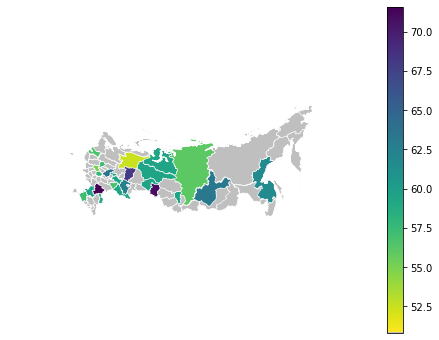

In [111]:
gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
)

In [113]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [43]:
colnameee = 'Выход светлых нефтепродуктов, %'
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [44]:
russia_data_2 = russia_data.copy()

In [45]:
m0, m1, m05

(50.8, 71.6, 61.199999999999996)

In [46]:
russia_data_2[russia_data_2[colnameee] > 68]

,ID_0,ISO,NAME_0,ID_1,NAME_1,TYPE_1,ENGTYPE_1,NL_NAME_1,VARNAME_1,geometry,...,Крэк-спред 2013,Крэк-спред 2018,Спарк-спред 2012,Спарк-спред 2018,Цены на мазут 2012,Цены на мазут 2018,Акцизы на нефтепродукты (факт. 2016 г. ),Акцизы на нефтепродукты (Прогноз 2017 г.),Цены на дизель 2013,Цены на дизель 2018
50,188,RUS,Russia,51,Omsk,Oblast,Region,Омская область,Omskaya Oblast,"POLYGON ((75.08675 58.12807, 75.09281 58.08725...",...,16837.858529,15133.897929,1620.408333,2988.995,10116.145635,6461.793841,5125.725026,3407.290870,32.252222,44.039209
76,188,RUS,Russia,77,Volgograd,Oblast,Region,Волгоградская область,Stalingrad|Volgogradskaya Oblast,"POLYGON ((43.13961 51.17092, 43.18914 51.15226...",...,17419.253151,14111.743550,NaN,NaN,11478.126754,17244.069529,5913.548512,4567.630949,30.041767,42.669378


In [47]:
russia_data_2[colnameee].mean()

59.88398888888889

In [48]:
russia_data_2[russia_data_2[colnameee] < 55].loc[:,['NL_NAME_1', colnameee]]

,NL_NAME_1,"Выход светлых нефтепродуктов, %"
31,Республика Коми,52.5
62,Саратовская область,50.8


In [49]:
# import seaborn as sns
# cmap = sns.diverging_palette(130, 10)

In [50]:
russia_data_2 = russia_data.copy()

In [51]:
replce10 = russia_data_2[colnameee].min() - (russia_data_2[colnameee].max() - russia_data_2[colnameee].min()) * 0.01
russia_data_2[colnameee] = russia_data_2[colnameee].fillna(replce10)
replce10

50.592

In [52]:
# russia_data_2.loc[0,colnameee] = replce10

In [53]:
proj = gcrs.AlbersEqualArea(central_longitude=94, central_latitude=60)

f, axarr = plt.subplots(1, 1, figsize=(100, 20), subplot_kw={
    'projection': proj
})

f.subplots_adjust(wspace=0)

gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=newcmp, linewidth=0.8, edgecolor='white', k=None,  
    projection=proj,  ax=axarr
)

sm = plt.cm.ScalarMappable(cmap=newcmp)
sm._A = []

cbar = plt.colorbar(sm,  fraction=0.003, pad = -0.04, ticks=[0, 0.5, 1]) #orientation='horizontal',
cbar.ax.set_yticklabels([ '50 %', '60 %', '70 %'])  
# cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
cbar.ax.tick_params(labelsize=40)

# gplt.choropleth(
#     russia_data_2, hue='Глубина переработки, %',
#     cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  legend = False,  #legend_kwargs={'size':3},
#     projection=proj,  ax=axarr[1] 
    
# )
# plt.savefig('foo1.png')

AttributeError: 'PathCollection' object has no property 'k'

<Figure size 7200x1440 with 2 Axes>

In [52]:
russia_data_2.columns

Index(['ID_0', 'ISO', 'NAME_0', 'ID_1', 'NAME_1', 'TYPE_1', 'ENGTYPE_1',
       'NL_NAME_1', 'VARNAME_1', 'geometry', 'Глубина переработки, %',
       'Выход светлых нефтепродуктов, %', 'Индекс Нельсона', 'ИК',
       'Кратность запасов газа добыче', 'Кратность запасов нефти добыче',
       'Цены на бензин 2013', 'Цены на бензин 2018',
       'Акцизы на нефтепродукты (суб.бюджет) 2014',
       'Акцизы на нефтепродукты (суб.бюджет) 2017', 'НДПИ (нефть) 2014',
       'НДПИ (нефть) 2017', 'Задолженность по НДПИ 2014',
       'Задолженность по НДПИ 2017',
       'Задолженность по акцизу на нефтепродукты 2014',
       'Задолженность по акцизу на нефтепродукты 2017',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017',
       'НДПИ (газ горючий природный) 2014',
       'НДПИ (газ горючий природный) 2017', 'НДПИ (газовый конденсат ) 2014',
       'НДПИ (газовый конденсат 

In [114]:
colnameee = 'Индекс Нельсона'

In [115]:
russia_data_2[russia_data_2[colnameee] > 8]

,ID_0,ISO,NAME_0,ID_1,NAME_1,TYPE_1,ENGTYPE_1,NL_NAME_1,VARNAME_1,geometry,...,Крэк-спред 2013,Крэк-спред 2018,Спарк-спред 2012,Спарк-спред 2018,Цены на мазут 2012,Цены на мазут 2018,Акцизы на нефтепродукты (факт. 2016 г. ),Акцизы на нефтепродукты (Прогноз 2017 г.),Цены на дизель 2013,Цены на дизель 2018
50,188,RUS,Russia,51,Omsk,Oblast,Region,Омская область,Omskaya Oblast,"POLYGON ((75.0867538452149 58.12807464599609, ...",...,16837.858529,15133.897929,1620.408333,2988.995,10116.145635,6461.793841,5125.725026,3407.290870,32.252222,44.039209
54,188,RUS,Russia,55,Perm',Kray,Territory,Пермский край,Molotov|Permskaya,"POLYGON ((59.49711227416992 61.57759094238287,...",...,19129.819786,17725.967187,1980.889167,3622.260,12286.880603,4802.298796,6481.740903,4888.781713,31.382651,44.941681


In [116]:
russia_data_2[colnameee].mean()

4.731513333333334

In [117]:
russia_data_2[russia_data_2[colnameee] < 1.5]

,ID_0,ISO,NAME_0,ID_1,NAME_1,TYPE_1,ENGTYPE_1,NL_NAME_1,VARNAME_1,geometry,...,Крэк-спред 2013,Крэк-спред 2018,Спарк-спред 2012,Спарк-спред 2018,Цены на мазут 2012,Цены на мазут 2018,Акцизы на нефтепродукты (факт. 2016 г. ),Акцизы на нефтепродукты (Прогноз 2017 г.),Цены на дизель 2013,Цены на дизель 2018
26,188,RUS,Russia,27,Kemerovo,Oblast,Region,Кемеровская область,Kemerovskaya Oblast,"POLYGON ((88.63730621337896 56.77808761596691,...",...,17526.901821,18904.569510,NaN,NaN,9400.000000,16274.226154,5246.034892,3741.696352,30.083670,43.598920
33,188,RUS,Russia,34,Krasnodar,Kray,Territory,Краснодарский край,Cossacks of the Black Sea|Kuban|Kubanskaya|Yek...,"(POLYGON ((36.6490287780764 45.31486129760748,...",...,17597.849989,14334.650665,2845.985833,4593.025,11289.652692,13770.098349,16536.047684,13127.969466,30.446878,42.934187
57,188,RUS,Russia,58,Rostov,Oblast,Region,Ростовская область,Province of the Don Cossacks|Provinz des Donis...,(POLYGON ((38.23456573486357 47.12014007568371...,...,16395.525167,11401.508159,2845.985833,4593.025,10320.930964,7922.096227,10690.712242,8230.351274,29.264449,41.162719


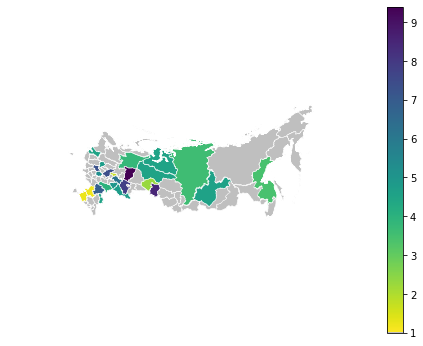

In [128]:
gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [129]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [118]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [119]:
replce10 = russia_data_2[colnameee].min() - (russia_data_2[colnameee].max() - russia_data_2[colnameee].min()) * 0.01
russia_data_2[colnameee] = russia_data_2[colnameee].fillna(replce10)
replce10

0.916

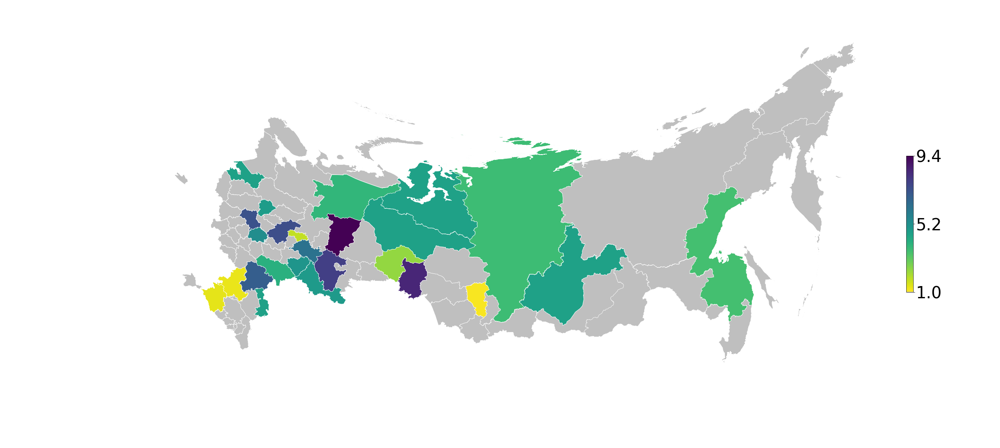

In [120]:
proj = gcrs.AlbersEqualArea(central_longitude=94, central_latitude=60)

f, axarr = plt.subplots(1, 1, figsize=(100, 20), subplot_kw={
    'projection': proj
})

f.subplots_adjust(wspace=0)

gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=newcmp, linewidth=0.8, edgecolor='white', k=None,  
    projection=proj,  ax=axarr
)

sm = plt.cm.ScalarMappable(cmap=newcmp)
sm._A = []

cbar = plt.colorbar(sm,  fraction=0.003, pad = -0.04, ticks=[0, 0.5, 1]) #orientation='horizontal',
cbar.ax.set_yticklabels([m0, m05,  m1])  
# cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
cbar.ax.tick_params(labelsize=40)

# gplt.choropleth(
#     russia_data_2, hue='Глубина переработки, %',
#     cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  legend = False,  #legend_kwargs={'size':3},
#     projection=proj,  ax=axarr[1] 
    
# )
# plt.savefig('foo1.png')

In [126]:
russia_data_2.columns

Index(['ID_0', 'ISO', 'NAME_0', 'ID_1', 'NAME_1', 'TYPE_1', 'ENGTYPE_1',
       'NL_NAME_1', 'VARNAME_1', 'geometry', 'Глубина переработки, %',
       'Выход светлых нефтепродуктов, %', 'Индекс Нельсона', 'ИК',
       'Кратность запасов газа добыче', 'Кратность запасов нефти добыче',
       'Цены на бензин 2013', 'Цены на бензин 2018',
       'Акцизы на нефтепродукты (суб.бюджет) 2014',
       'Акцизы на нефтепродукты (суб.бюджет) 2017', 'НДПИ (нефть) 2014',
       'НДПИ (нефть) 2017', 'Задолженность по НДПИ 2014',
       'Задолженность по НДПИ 2017',
       'Задолженность по акцизу на нефтепродукты 2014',
       'Задолженность по акцизу на нефтепродукты 2017',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017',
       'НДПИ (газ горючий природный) 2014',
       'НДПИ (газ горючий природный) 2017', 'НДПИ (газовый конденсат ) 2014',
       'НДПИ (газовый конденсат 

In [121]:
colnameee = 'ИК'

In [122]:
russia_data_2[russia_data_2[colnameee] > 160]

,ID_0,ISO,NAME_0,ID_1,NAME_1,TYPE_1,ENGTYPE_1,NL_NAME_1,VARNAME_1,geometry,...,Крэк-спред 2013,Крэк-спред 2018,Спарк-спред 2012,Спарк-спред 2018,Цены на мазут 2012,Цены на мазут 2018,Акцизы на нефтепродукты (факт. 2016 г. ),Акцизы на нефтепродукты (Прогноз 2017 г.),Цены на дизель 2013,Цены на дизель 2018
31,188,RUS,Russia,32,Komi,Respublika,Republic,Республика Коми,Komi A.S.S.R.|Republic of Komi|Respublika Komi,"POLYGON ((65.14199066162109 68.39404296875023,...",...,19698.975733,20849.565579,1910.164167,4362.495833,14164.429348,18645.509167,2419.690023,1728.083821,32.393263,45.15026
72,188,RUS,Russia,73,Tyumen',Oblast,Region,Тюменская область,Tobol'sk|Tobol'skaya G.|Tyumenskaya Oblast,"POLYGON ((69.68837738037115 59.89642333984375,...",...,18406.376908,17518.431212,NaN,NaN,9245.216625,5893.001123,4581.894446,3448.159583,32.625034,44.76619


In [123]:
russia_data_2[colnameee].mean()

90.65445992718418

In [124]:
russia_data_2[russia_data_2[colnameee] < 20]

,ID_0,ISO,NAME_0,ID_1,NAME_1,TYPE_1,ENGTYPE_1,NL_NAME_1,VARNAME_1,geometry,...,Крэк-спред 2013,Крэк-спред 2018,Спарк-спред 2012,Спарк-спред 2018,Цены на мазут 2012,Цены на мазут 2018,Акцизы на нефтепродукты (факт. 2016 г. ),Акцизы на нефтепродукты (Прогноз 2017 г.),Цены на дизель 2013,Цены на дизель 2018
29,188,RUS,Russia,30,Khanty-Mansiy,Avtonomnyy Okrug,Autonomous Province,Ханты-Мансийский автономный округ-Югра,Khanty-Mansiysk|Khanty-Mansiyskiy A.Okr.|Khant...,"POLYGON ((62.74229812622076 64.90599060058605,...",...,NaN,NaN,1755.347500,3459.500833,NaN,NaN,5220.917687,4112.828448,34.924903,47.253646
57,188,RUS,Russia,58,Rostov,Oblast,Region,Ростовская область,Province of the Don Cossacks|Provinz des Donis...,(POLYGON ((38.23456573486357 47.12014007568371...,...,16395.525167,11401.508159,2845.985833,4593.025000,10320.930964,7922.096227,10690.712242,8230.351274,29.264449,41.162719
79,188,RUS,Russia,80,Yamal-Nenets,Avtonomnyy Okrug,Autonomous Province,Ямало-Ненецкий автономный округ,Yamalo-Nenetskiy A. Okrug,(POLYGON ((71.98072814941418 66.26093292236339...,...,NaN,NaN,1755.347500,3459.500833,NaN,NaN,2015.658760,1394.782898,34.850797,NaN


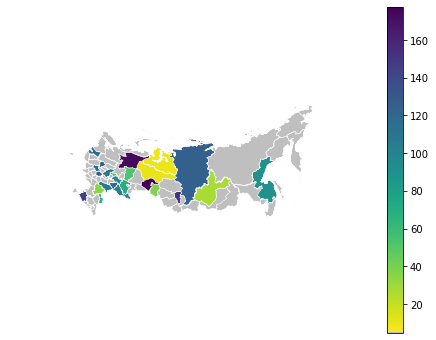

In [125]:
gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [126]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [127]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [128]:
m0, m05,  m1

(4.746875, 91.21436342592595, 177.68185185185192)

In [129]:
viridis = cm.get_cmap('viridis', 256)
newcolors = viridis(np.linspace(0, 1, 256))
grey = np.array([192/256, 192/256, 192/256, 1])
newcolors[:1, :] = grey
backcmp = ListedColormap(newcolors)

In [131]:
replce10 = russia_data_2[colnameee].min() - (russia_data_2[colnameee].max() - russia_data_2[colnameee].min()) * 0.01
russia_data_2[colnameee] = russia_data_2[colnameee].fillna(replce10)
replce10

3.017525231481481

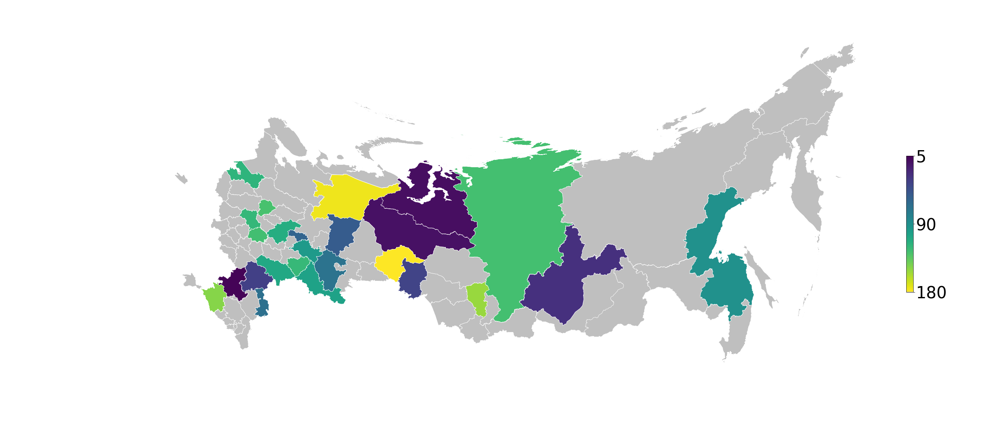

In [132]:
proj = gcrs.AlbersEqualArea(central_longitude=94, central_latitude=60)

f, axarr = plt.subplots(1, 1, figsize=(100, 20), subplot_kw={
    'projection': proj
})

f.subplots_adjust(wspace=0)

gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=backcmp, linewidth=0.8, edgecolor='white', k=None,  
    projection=proj,  ax=axarr
)

sm = plt.cm.ScalarMappable(cmap=newcmp)
sm._A = []

cbar = plt.colorbar(sm,  fraction=0.003, pad = -0.04, ticks=[0, 0.5, 1]) #orientation='horizontal',
cbar.ax.set_yticklabels([180, 90, 5])  
# cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
cbar.ax.tick_params(labelsize=40)

# gplt.choropleth(
#     russia_data_2, hue='Глубина переработки, %',
#     cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  legend = False,  #legend_kwargs={'size':3},
#     projection=proj,  ax=axarr[1] 
    
# )
# plt.savefig('foo1.png')

### Отношение между объемом запасов и объемом добычи.

- [ЗА 1970-2007: ДОБЫЧА НЕФТИ, ВКЛЮЧАЯ ГАЗОВЫЙ КОНДЕНСАТ, ПО СУБЪЕКТАМ РОССИЙСКОЙ ФЕДЕРАЦИИ](http://www.gks.ru/bgd/regl/b08_13/IssWWW.exe/Stg/d3/13-27.htm), [1970-2005](https://uisrussia.msu.ru/stat/Publications/Ejeg2006/Ejeg2006_13_/Ejeg2006_13_290.htm?lang=ru)
- [О СОСТОЯНИИ И ИСПОЛЬЗОВАНИИ МИНЕРАЛЬНО-СЫРЬЕВЫХ РЕСУРСОВ РОССИЙСКОЙ ФЕДЕРАЦИИ В 2015 ГОДУ](http://www.mnr.gov.ru/upload/iblock/5ef/2015_msr.pdf)
- [Use of Statistical Indicators to Measure Crude Oil and Natural Gas Reserves and Production ](http://www.upg-bulletin-se.ro/archive/2014-1/5.Lazar_Lazar.pdf)

- [Нефть-2017: итоги,тенденции, прогнозы](http://www.ngv.ru/upload/iblock/939/93972e1f25fa9b33508ca6c348e8614b.pdf)

- [Нефтегазовый комплекс России –2017. ](http://www.ipgg.sbras.ru/ru/files/orgunits/energyreport/petroleum-industry-russia-2017.pdf)

- [Мировые  тенденции  геологоразведочных работ на нефть и газ](https://www.imemo.ru/files/File/ru/conf/2018/21122018/PREZ/01-17-Milovidov.pdf)

Описание показателя:


Запасы нефти:

- [Дагестан](https://cyberleninka.ru/article/v/otsenka-eksportnogo-potentsiala-neftegazodobyvayuschey-otrasli-respubliki-dagestan)
- [Калмыкия](https://cyberleninka.ru/article/v/razvitie-neftegazovogo-kompleksa-respubliki-kalmykiya-sostoyanie-i-perspektivy)
- [Омская](http://mpr.omskportal.ru/ru/RegionalPublicAuthorities/executivelist/MPR/pravaya-kolonka/ecopasport/PageContent/0/body_files/file21/%D0%A0%D0%B0%D0%B7%D0%B4%D0%B5%D0%BB%207.%20%D0%9C%D0%98%D0%9D%D0%95%D0%A0%D0%90%D0%9B%D0%AC%D0%9D%D0%9E-%D0%A1%D0%AB%D0%A0%D0%AC%D0%95%D0%92%D0%AB%D0%95%20%D0%A0%D0%95%D0%A1%D0%A3%D0%A0%D0%A1%D0%AB.%20%D0%9C%D0%98%D0%9D%D0%95%D0%A0%D0%90%D0%9B%D0%AC%D0%9D%D0%9E-%D0%A1%D0%AB%D0%A0%D0%AC%D0%95%D0%92%D0%AB%D0%95%20%D0%A0%D0%95%D0%A1%D0%A3%D0%A0%D0%A1%D0%AB.%20%D0%9C%D0%98%D0%9D%D0%95%D0%A0%D0%90%D0%9B%D0%AC%D0%9D%D0%9E-%D0%A1%D0%AB%D0%A0%D0%AC%D0%95%D0%92%D0%AB%D0%95%20%D0%A0%D0%95%D0%A1%D0%A3%D0%A0%D0%A1%D0%AB.pdf)
- Ингушетия  — экологический паспорт
- [Крым](https://tass.ru/ekonomika/1094468)
- [Грозненские месторождения Роснефть](https://ru.wikipedia.org/wiki/%D0%A1%D0%BF%D0%B8%D1%81%D0%BE%D0%BA_%D0%BD%D0%B5%D1%84%D1%82%D1%8F%D0%BD%D1%8B%D1%85_%D0%BC%D0%B5%D1%81%D1%82%D0%BE%D1%80%D0%BE%D0%B6%D0%B4%D0%B5%D0%BD%D0%B8%D0%B9_%D0%A0%D0%BE%D1%81%D1%81%D0%B8%D0%B8)
- [Краснодар](http://geolike.ru/page/gl_3671.htm)
    - Еще в 2014 г Министерство экономики Краснодарского края сообщало, что в регионе запасы сырья извлекли на 98,5%.
- [Волгоградская область](http://www.vestnik.vsu.ru/pdf/geograph/2014/02/2014-02-06.pdf)
- [Калининградская область](https://gov39.ru/region/natural.php)
- [Кировская область](https://nature.kirovreg.ru/ecology/nedropolzovanie/mineralno-syrevaya-baza-kirovskoy-oblasti/)
- [Новосибирская](https://ksonline.ru/238048/neftyanaya-promyshlennost-v-novosibirskoj-oblasti-prodolzhaet-razvivatsya/)
- [Пензенская](https://catalogmineralov.ru/deposit/penzenskaya_oblast/)
- [Cахалинская](https://cyberleninka.ru/article/v/neftegazovye-proekty-sahalinskoy-oblasti)




In [126]:
russia_data_2.columns

Index(['ID_0', 'ISO', 'NAME_0', 'ID_1', 'NAME_1', 'TYPE_1', 'ENGTYPE_1',
       'NL_NAME_1', 'VARNAME_1', 'geometry', 'Глубина переработки, %',
       'Выход светлых нефтепродуктов, %', 'Индекс Нельсона', 'ИК',
       'Кратность запасов газа добыче', 'Кратность запасов нефти добыче',
       'Цены на бензин 2013', 'Цены на бензин 2018',
       'Акцизы на нефтепродукты (суб.бюджет) 2014',
       'Акцизы на нефтепродукты (суб.бюджет) 2017', 'НДПИ (нефть) 2014',
       'НДПИ (нефть) 2017', 'Задолженность по НДПИ 2014',
       'Задолженность по НДПИ 2017',
       'Задолженность по акцизу на нефтепродукты 2014',
       'Задолженность по акцизу на нефтепродукты 2017',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017',
       'НДПИ (газ горючий природный) 2014',
       'НДПИ (газ горючий природный) 2017', 'НДПИ (газовый конденсат ) 2014',
       'НДПИ (газовый конденсат 

In [133]:
colnameee = 'Кратность запасов нефти добыче'

In [134]:
russia_data_2[colnameee][russia_data_2[colnameee]>200] = 200

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [135]:
# russia_data_2[colnameee] = np.exp(russia_data_2[colnameee])

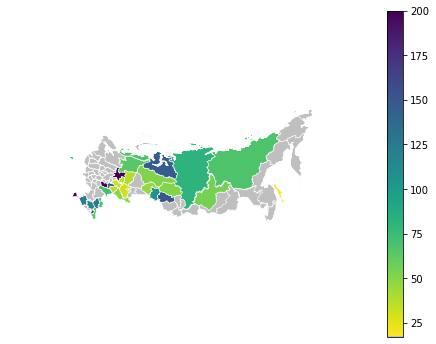

In [136]:
gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [137]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [138]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [139]:
m0, m05,  m1

(17.12, 108.56, 200.0)

In [140]:
replce10 = russia_data_2[colnameee].min() - (russia_data_2[colnameee].max() - russia_data_2[colnameee].min()) * 0.01
russia_data_2[colnameee] = russia_data_2[colnameee].fillna(replce10)
replce10

15.291200000000002

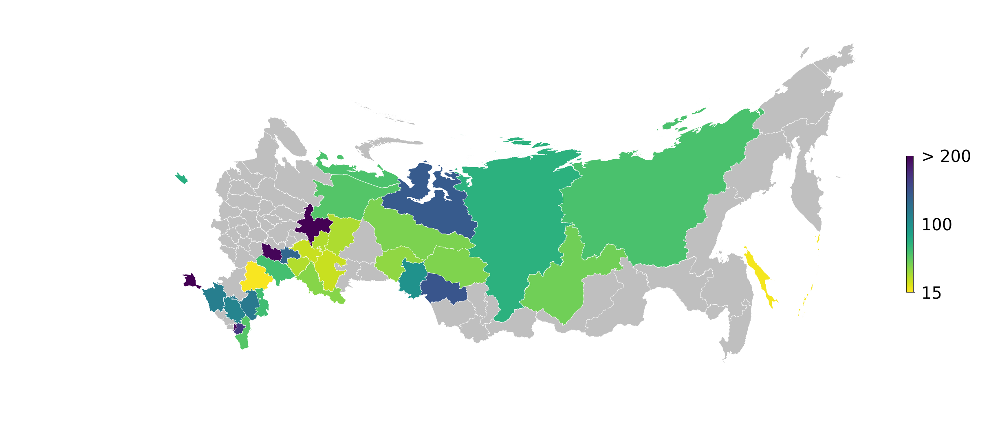

In [141]:
proj = gcrs.AlbersEqualArea(central_longitude=94, central_latitude=60)

f, axarr = plt.subplots(1, 1, figsize=(100, 20), subplot_kw={
    'projection': proj
})

f.subplots_adjust(wspace=0)

gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=newcmp, linewidth=0.8, edgecolor='white', k=None,  
    projection=proj,  ax=axarr
)

sm = plt.cm.ScalarMappable(cmap=newcmp)
sm._A = []

cbar = plt.colorbar(sm,  fraction=0.003, pad = -0.04, ticks=[0, 0.5, 1]) #orientation='horizontal',
cbar.ax.set_yticklabels([' 15', ' 100', ' > 200'])  
# cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
cbar.ax.tick_params(labelsize=40)

# gplt.choropleth(
#     russia_data_2, hue='Глубина переработки, %',
#     cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  legend = False,  #legend_kwargs={'size':3},
#     projection=proj,  ax=axarr[1] 
    
# )
# plt.savefig('foo1.png')

### Цены на нефть и нефтепродукты

- [Паспорт набора данных "Интерактивная карта цен на нефтепродукты в России"](http://fas.gov.ru/opendata/7703516539-petrolpricesmap)
    - [табло](https://public.tableau.com/profile/fasanalytics#!/vizhome/_1206/sheet0)

- [ЦБСД](http://www.gks.ru/dbscripts/cbsd/DBInet.cgi)


Here are some important factors that affect crude oil prices.

- Oil demand: Broadly affected by the state of the global economy, as more economic activity generally requires more energy. Recently, non-OECD (Organisation for Economic Co-operation and Development) nations have been consuming more and more oil as their economies grow and develop. Meanwhile, oil demand from OECD nations has been flat or falling because their economies are more mature and they’re further using other fuel sources such as renewables, nuclear, and natural gas.
-   Oil supply: Affected by worldwide oil production. In recent years, oil production in the United States and Canada has increased greatly, which has added stability to global oil supply because production from other sources such as the North Sea has begun to decline. Additionally, OPEC (Organization of Petroleum Exporting Countries) plays a major role in setting global oil supply, as the member countries produce a significant portion of the world’s global oil. OPEC members also periodically convene to discuss optimal pricing and supply.
-   Speculation: Speculation by market participants through instruments such as crude oil futures also plays a role in setting oil prices. For instance, regarding the extreme oil price volatility seen in 2008, when prices hit almost $ \$ $ 150 per barrel at points, economist Thomas Palley stated, “The actual behavior of oil prices is consistent with speculation. In June, oil prices leapt by $ \$ $ 11 in one day, and in July they fell back by $ \$ $ 15 in three days. Such volatility does not fit a fundamentals-driven market.”



In [142]:
russia_data.columns

Index(['ID_0', 'ISO', 'NAME_0', 'ID_1', 'NAME_1', 'TYPE_1', 'ENGTYPE_1',
       'NL_NAME_1', 'VARNAME_1', 'geometry', 'Глубина переработки, %',
       'Выход светлых нефтепродуктов, %', 'Индекс Нельсона', 'ИК',
       'Кратность запасов газа добыче', 'Кратность запасов нефти добыче',
       'Цены на бензин 2013', 'Цены на бензин 2018',
       'Акцизы на нефтепродукты (суб.бюджет) 2014',
       'Акцизы на нефтепродукты (суб.бюджет) 2017', 'НДПИ (нефть) 2014',
       'НДПИ (нефть) 2017', 'Задолженность по НДПИ 2014',
       'Задолженность по НДПИ 2017',
       'Задолженность по акцизу на нефтепродукты 2014',
       'Задолженность по акцизу на нефтепродукты 2017',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017',
       'НДПИ (газ горючий природный) 2014',
       'НДПИ (газ горючий природный) 2017', 'НДПИ (газовый конденсат ) 2014',
       'НДПИ (газовый конденсат 

In [143]:
russia_data_3 = russia_data.copy()

In [144]:
# russia_data_3.iloc[:,16:]

In [145]:
russia_data_3.iloc[:,16:] = russia_data_3.iloc[:,16:].div(russia_data_3.iloc[:,16:].mean(axis=0))

In [146]:
viridis = cm.get_cmap('RdYlBu', 256)
newcolors = viridis(np.linspace(1, -1, 256))
grey = np.array([192/256, 192/256, 192/256, 1])
newcolors[:1, :] = grey
rbcmp = ListedColormap(newcolors)

In [147]:
russia_data_3['Цены на бензин 2013']

0     1.009560
1     0.946472
2     1.076056
3     0.988356
4     1.000623
        ...   
79    1.077340
80    0.952539
81    1.083348
82    1.050709
83         NaN
Name: Цены на бензин 2013, Length: 84, dtype: float64

In [148]:
colnameee = 'Цены на бензин 2013'

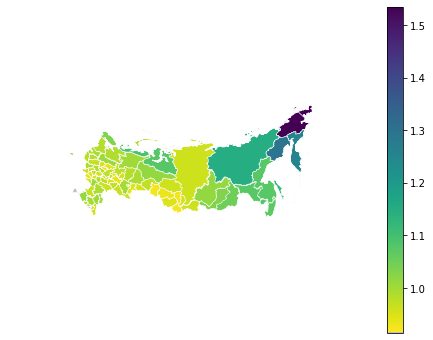

In [149]:
gplt.choropleth(
    russia_data_3, hue=colnameee,
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [150]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [151]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [152]:
m0, m05,  m1

(27.64833449074073, 37.02916724537036, 46.41)

In [153]:
russia_data_2.columns

Index(['ID_0', 'ISO', 'NAME_0', 'ID_1', 'NAME_1', 'TYPE_1', 'ENGTYPE_1',
       'NL_NAME_1', 'VARNAME_1', 'geometry', 'Глубина переработки, %',
       'Выход светлых нефтепродуктов, %', 'Индекс Нельсона', 'ИК',
       'Кратность запасов газа добыче', 'Кратность запасов нефти добыче',
       'Цены на бензин 2013', 'Цены на бензин 2018',
       'Акцизы на нефтепродукты (суб.бюджет) 2014',
       'Акцизы на нефтепродукты (суб.бюджет) 2017', 'НДПИ (нефть) 2014',
       'НДПИ (нефть) 2017', 'Задолженность по НДПИ 2014',
       'Задолженность по НДПИ 2017',
       'Задолженность по акцизу на нефтепродукты 2014',
       'Задолженность по акцизу на нефтепродукты 2017',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017',
       'НДПИ (газ горючий природный) 2014',
       'НДПИ (газ горючий природный) 2017', 'НДПИ (газовый конденсат ) 2014',
       'НДПИ (газовый конденсат 

In [154]:
colnameee = 'Цены на бензин 2013'

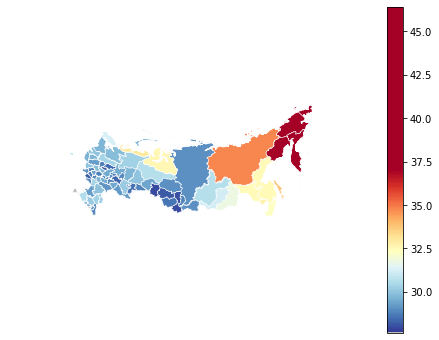

In [265]:
gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [155]:
russia_data_3[colnameee][russia_data_3[colnameee] > 1.3] = 1.3

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [156]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [157]:
m1 = russia_data_3[colnameee].max()
m0 = russia_data_3[colnameee].min()
m05 = (m1+m0)/2

In [158]:
m0, m05,  m1

(0.9146709845214548, 1.1073354922607275, 1.3)

In [159]:
colnameee = 'Цены на бензин 2018'

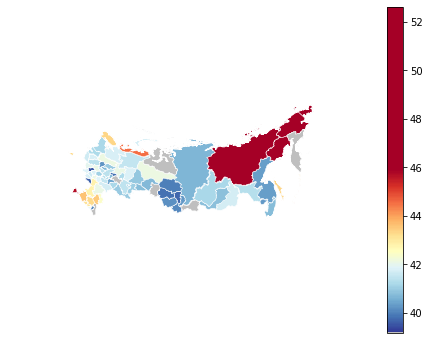

In [281]:
gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [160]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [161]:
m1 = russia_data_3[colnameee].max()
m0 = russia_data_3[colnameee].min()
m05 = (m1+m0)/2

In [162]:
m0, m05,  m1

(0.9360320089643158, 1.0966327713116575, 1.257233533658999)

In [163]:
10/(10+25)

0.2857142857142857

In [ ]:
# replce10 = russia_data_2[colnameee].min() - (russia_data_2[colnameee].max() - russia_data_2[colnameee].min()) * 0.01
# russia_data_2[colnameee] = russia_data_2[colnameee].fillna(replce10)
# replce10

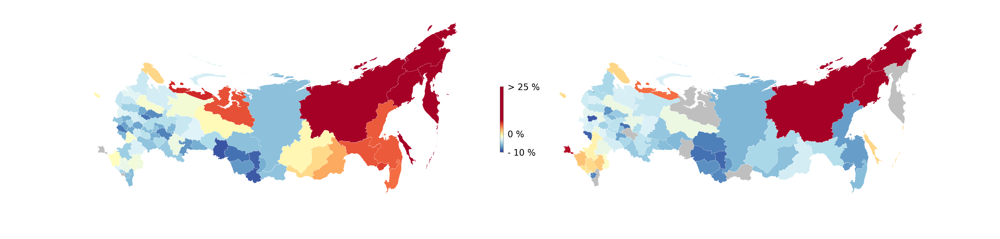

In [291]:
proj = gcrs.AlbersEqualArea(central_longitude=94, central_latitude=60)

f, axarr = plt.subplots(1, 2, figsize=(100, 20), subplot_kw={
    'projection': proj
})

f.subplots_adjust(wspace=-0.15)

gplt.choropleth(
    russia_data_3, hue='Цены на бензин 2013',
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None,  
    projection=proj,  ax=axarr[0]
)


gplt.choropleth(
    russia_data_3, hue='Цены на бензин 2018',
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None,  legend = False,  #legend_kwargs={'size':3},
    projection=proj,  ax=axarr[1] 
    
)

sm = plt.cm.ScalarMappable(cmap=rbcmp)
sm._A = []

cbar = plt.colorbar(sm, ax=axarr[0], fraction=0.005, pad = -0.05, ticks=[0, 0.28, 1]) #orientation='horizontal',
cbar.ax.set_yticklabels([' - 10 %', ' 0 %', ' > 25 %'])  
# cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
cbar.ax.tick_params(labelsize=40)


In [239]:
russia_data.columns

Index(['ID_0', 'ISO', 'NAME_0', 'ID_1', 'NAME_1', 'TYPE_1', 'ENGTYPE_1',
       'NL_NAME_1', 'VARNAME_1', 'geometry', 'Глубина переработки, %',
       'Выход светлых нефтепродуктов, %', 'Индекс Нельсона', 'ИК',
       'Кратность запасов газа добыче', 'Кратность запасов нефти добыче',
       'Цены на бензин 2013', 'Цены на бензин 2018',
       'Акцизы на нефтепродукты (суб.бюджет) 2014',
       'Акцизы на нефтепродукты (суб.бюджет) 2017', 'НДПИ (нефть) 2014',
       'НДПИ (нефть) 2017', 'Задолженность по НДПИ 2014',
       'Задолженность по НДПИ 2017',
       'Задолженность по акцизу на нефтепродукты 2014',
       'Задолженность по акцизу на нефтепродукты 2017',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017',
       'НДПИ (газ горючий природный) 2014',
       'НДПИ (газ горючий природный) 2017', 'НДПИ (газовый конденсат ) 2014',
       'НДПИ (газовый конденсат 

In [307]:
colnameee = 'Цены на мазут 2012'

In [309]:
# russia_data_2[colnameee][colnameee]<60]

In [310]:
m1 = russia_data_3[colnameee].max()
m0 = russia_data_3[colnameee].min()
m05 = (m1+m0)/2

In [311]:
m0, m05,  m1

(0.6010194571709567, 1.0579987155873327, 1.5149779740037088)

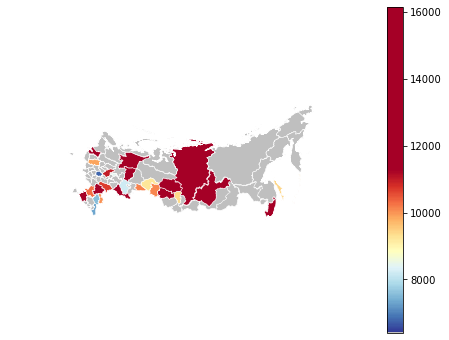

In [298]:
gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [318]:
russia_data_3[colnameee][russia_data_3[colnameee] < 0.61] = 0.6

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [320]:
russia_data_3[colnameee][russia_data_3[colnameee] > 1.4] = 1.4

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [255]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [321]:
m1 = russia_data_3[colnameee].max()
m0 = russia_data_3[colnameee].min()
m05 = (m1+m0)/2

In [322]:
m0, m05,  m1

(0.6, 1.0, 1.4)

In [323]:
colnameee = 'Цены на мазут 2018'

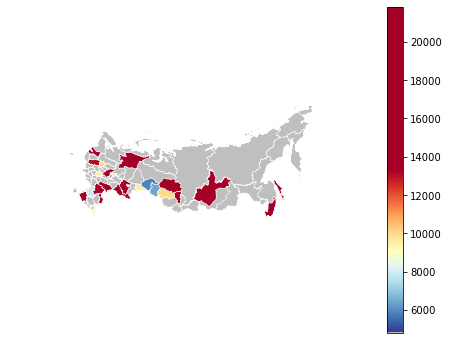

In [302]:
gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [303]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [325]:
russia_data_3[colnameee][russia_data_3[colnameee] < 0.61] = 0.6

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [327]:
russia_data_3[colnameee][russia_data_3[colnameee] > 1.4] = 1.4

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [328]:
m1 = russia_data_3[colnameee].max()
m0 = russia_data_3[colnameee].min()
m05 = (m1+m0)/2

In [329]:
m0, m05,  m1

(0.6, 1.0, 1.4)

In [330]:
10/(10+25)

0.2857142857142857

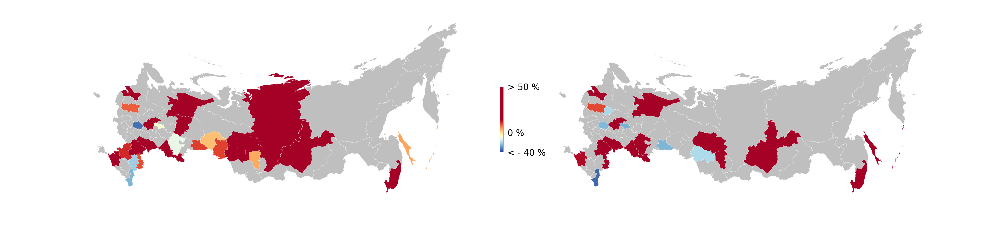

In [338]:
proj = gcrs.AlbersEqualArea(central_longitude=94, central_latitude=60)

f, axarr = plt.subplots(1, 2, figsize=(100, 20), subplot_kw={
    'projection': proj
})

f.subplots_adjust(wspace=-0.15)

gplt.choropleth(
    russia_data_3, hue='Цены на мазут 2012',
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None,  
    projection=proj,  ax=axarr[0]
)



gplt.choropleth(
    russia_data_3, hue='Цены на мазут 2018',
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None,  legend = False,  #legend_kwargs={'size':3},
    projection=proj,  ax=axarr[1] 
    
)



sm = plt.cm.ScalarMappable(cmap=rbcmp)
sm._A = []

cbar = plt.colorbar(sm, ax=axarr[0], fraction=0.005, pad = -0.05, ticks=[0, 0.3, 1]) #orientation='horizontal',
cbar.ax.set_yticklabels([' < - 40 %', ' 0 %', ' > 50 %'])  
# cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
cbar.ax.tick_params(labelsize=40);


In [239]:
russia_data.columns

Index(['ID_0', 'ISO', 'NAME_0', 'ID_1', 'NAME_1', 'TYPE_1', 'ENGTYPE_1',
       'NL_NAME_1', 'VARNAME_1', 'geometry', 'Глубина переработки, %',
       'Выход светлых нефтепродуктов, %', 'Индекс Нельсона', 'ИК',
       'Кратность запасов газа добыче', 'Кратность запасов нефти добыче',
       'Цены на бензин 2013', 'Цены на бензин 2018',
       'Акцизы на нефтепродукты (суб.бюджет) 2014',
       'Акцизы на нефтепродукты (суб.бюджет) 2017', 'НДПИ (нефть) 2014',
       'НДПИ (нефть) 2017', 'Задолженность по НДПИ 2014',
       'Задолженность по НДПИ 2017',
       'Задолженность по акцизу на нефтепродукты 2014',
       'Задолженность по акцизу на нефтепродукты 2017',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017',
       'НДПИ (газ горючий природный) 2014',
       'НДПИ (газ горючий природный) 2017', 'НДПИ (газовый конденсат ) 2014',
       'НДПИ (газовый конденсат 

In [352]:
colnameee = 'Цены на дизель 2013'

In [353]:
# russia_data_2[colnameee][colnameee]<60]

In [354]:
m1 = russia_data_3[colnameee].max()
m0 = russia_data_3[colnameee].min()
m05 = (m1+m0)/2

In [355]:
m0, m05,  m1

(0.7259900618570324, 1.1216608085729953, 1.5173315552889584)

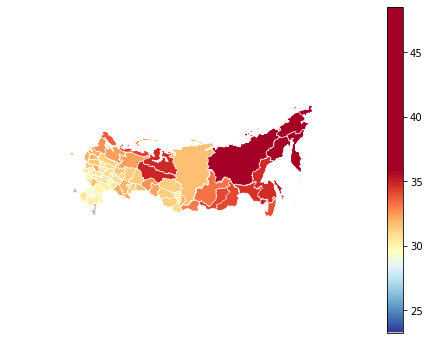

In [351]:
gplt.choropleth(
    russia_data, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [359]:
russia_data_3[colnameee][russia_data_3[colnameee] < 0.9] = 0.9

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [357]:
russia_data_3[colnameee][russia_data_3[colnameee] > 1.4] = 1.4

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [255]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [360]:
m1 = russia_data_3[colnameee].max()
m0 = russia_data_3[colnameee].min()
m05 = (m1+m0)/2

In [361]:
m0, m05,  m1

(0.9, 1.15, 1.4)

In [345]:
colnameee = 'Цены на дизель 2018'

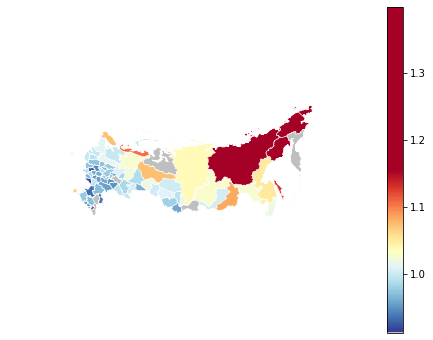

In [346]:
gplt.choropleth(
    russia_data_3, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [303]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [325]:
russia_data_3[colnameee][russia_data_3[colnameee] < 0.61] = 0.6

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [327]:
russia_data_3[colnameee][russia_data_3[colnameee] > 1.4] = 1.4

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [347]:
m1 = russia_data_3[colnameee].max()
m0 = russia_data_3[colnameee].min()
m05 = (m1+m0)/2

In [348]:
m0, m05,  m1

(0.9116764396464182, 1.1551670604884996, 1.3986576813305809)

In [330]:
10/(10+25)

0.2857142857142857

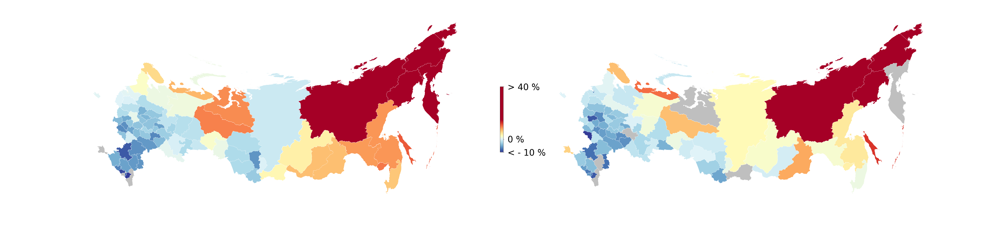

In [363]:
proj = gcrs.AlbersEqualArea(central_longitude=94, central_latitude=60)

f, axarr = plt.subplots(1, 2, figsize=(100, 20), subplot_kw={
    'projection': proj
})

f.subplots_adjust(wspace=-0.15)

gplt.choropleth(
    russia_data_3, hue='Цены на дизель 2013',
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None,  
    projection=proj,  ax=axarr[0]
)



gplt.choropleth(
    russia_data_3, hue='Цены на дизель 2018',
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None,  legend = False,  #legend_kwargs={'size':3},
    projection=proj,  ax=axarr[1] 
    
)



sm = plt.cm.ScalarMappable(cmap=rbcmp)
sm._A = []

cbar = plt.colorbar(sm, ax=axarr[0], fraction=0.005, pad = -0.05, ticks=[0, 0.2, 1]) #orientation='horizontal',
cbar.ax.set_yticklabels([' < - 10 %', ' 0 %', ' > 40 %'])  
# cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
cbar.ax.tick_params(labelsize=40);


### Крэк-спред

- [СПРЕДЫ ПЕРЕРАБОТКИ: Крек-спред](http://www.fondovik.com/bazovie-znaniya/stati-finansovie-instrumenti/fyuchersnie-spredi/krek-spred/)
- [EIA: ПРИБЫЛИ НПЗ НЕДОСТАТОЧНО ДЛЯ КОМПЕНСАЦИИ НИЗКИХ ДОХОДОВ MAJORS](http://www.ngv.ru/analytics/eia_pribyli_npz_nedostatochno_dlya_kompensatsii_nizkikh_dokhodov_majors/)
- [EIA: crack-spread definition](https://www.eia.gov/todayinenergy/includes/crackspread_explain.php )
- [Crack Spread 101](https://marketrealist.com/2013/07/crack-spread-101-part-1-whats-a-crack-spread/)

We use the example of the “Bloomberg WTI Cushing Crude Oil 321 Crack Spread/Gulf Coast” (Bloomberg ticker CRKS321 Index). Bloomberg notes that the inputs are the following:

- Crude oil – WTI at Cushing (USCRWTIC Index ) – closing price at July 19, 2013, of \$ 108.05 per barrel
- Gasoline – U.S. Gulf prompt 87 Octane gasoline (MOIGC87P Index) – closing price at July 19, 2013, of \$2.92 per gallon (multiply by 42 to get price per barrel of \$122.64)
- Heating oil or gasoil – U.S. Gulf No. 2 Oil (NO2IGCPR index) – closing price at July 19, 2013, of \$2.87 per gallon (multiply by 42 to get price per barrel of \$120.54)

Цены на мазут:

- [ТОПЛИВНЫЙ  РЫНОК  РОССИИ](http://web.archive.org/web/20110725123304/http://minenergo.gov.ru/upload/iblock/333/33363d868cf93701591957ccd67583b1.pdf)
- [КОРТЕС](http://www.kortes.com/products/price/)
    - [РЕГИОНАЛЬНЫЕ ОПТОВЫЕ ЦЕНЫ НА ОСНОВНЫЕ НЕФТЕПРОДУКТЫ ](http://www.kortes.com/products/pdf/reg.pdf)
- [ЦБСД Индексы по нефтепереработке](http://www.gks.ru/free_doc/new_site/prices/bd/bd_9420059.htm)

Цены на нефть:

- [Индексы цен нефтепродуктов](http://spimex.com/documents/indexes/)
    - [Методика расчета региональных биржевых индексов цен сырой нефти](http://spimex.com/upload/iblock/9b0/9b06acc0ae4d4f48eaedaa5473554cf0.pdf)
- [Коэффициенты перевода литров в тонны:](http://bogatoe.samregion.ru/external/omsu_bogatoe/files/c_683/Perevod_benzina_v_tonny.pdf)

In [164]:
viridis = cm.get_cmap('RdYlBu', 256)
newcolors = viridis(np.linspace(-1, 1, 256))
grey = np.array([192/256, 192/256, 192/256, 1])
newcolors[:1, :] = grey
bcrbcmp = ListedColormap(newcolors)

In [165]:
russia_data.columns

Index(['ID_0', 'ISO', 'NAME_0', 'ID_1', 'NAME_1', 'TYPE_1', 'ENGTYPE_1',
       'NL_NAME_1', 'VARNAME_1', 'geometry', 'Глубина переработки, %',
       'Выход светлых нефтепродуктов, %', 'Индекс Нельсона', 'ИК',
       'Кратность запасов газа добыче', 'Кратность запасов нефти добыче',
       'Цены на бензин 2013', 'Цены на бензин 2018',
       'Акцизы на нефтепродукты (суб.бюджет) 2014',
       'Акцизы на нефтепродукты (суб.бюджет) 2017', 'НДПИ (нефть) 2014',
       'НДПИ (нефть) 2017', 'Задолженность по НДПИ 2014',
       'Задолженность по НДПИ 2017',
       'Задолженность по акцизу на нефтепродукты 2014',
       'Задолженность по акцизу на нефтепродукты 2017',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017',
       'НДПИ (газ горючий природный) 2014',
       'НДПИ (газ горючий природный) 2017', 'НДПИ (газовый конденсат ) 2014',
       'НДПИ (газовый конденсат 

In [166]:
colnameee = 'Крэк-спред 2013'

In [167]:
# russia_data_2[colnameee][colnameee]<60]

In [168]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [170]:
m0, m05,  m1

(15316.18160362968, 18121.311865672804, 20926.44212771593)

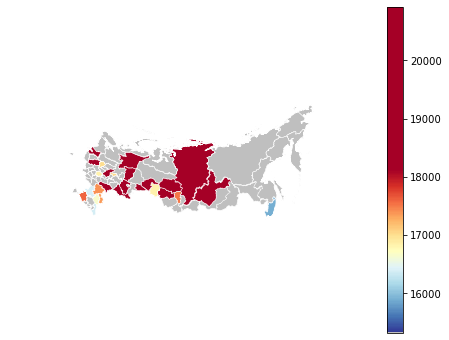

In [171]:
gplt.choropleth(
    russia_data, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [172]:
russia_data_2[colnameee][russia_data_2[colnameee] > 19000] =  19000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [173]:
russia_data_2[colnameee][russia_data_2[colnameee] < 16000]
# = 1.4

55    15901.810715
59    15316.181604
Name: Крэк-спред 2013, dtype: float64

In [174]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [175]:
m1 = russia_data_3[colnameee].max()
m0 = russia_data_3[colnameee].min()
m05 = (m1+m0)/2

In [361]:
m0, m05,  m1

(0.9, 1.15, 1.4)

In [176]:
replce10 = russia_data_2[colnameee].min() - (russia_data_2[colnameee].max() - russia_data_2[colnameee].min()) * 0.01
russia_data_2[colnameee] = russia_data_2[colnameee].fillna(replce10)
replce10

15279.343419665976

In [177]:
colnameee = 'Крэк-спред 2018'

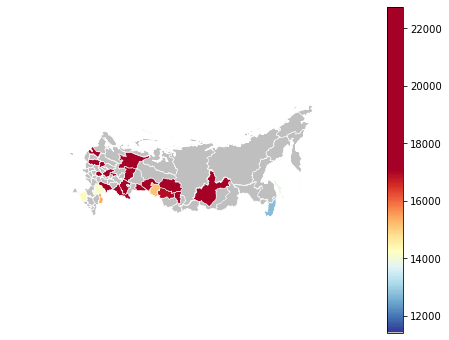

In [372]:
gplt.choropleth(
    russia_data, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [303]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [178]:
russia_data_2[colnameee][russia_data_2[colnameee] > 19000] = 19000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [179]:
russia_data_2[colnameee][russia_data_2[colnameee] < 15000] = 15000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [180]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [181]:
m0, m05,  m1

(15000.0, 17000.0, 19000.0)

In [182]:
replce10 = russia_data_2[colnameee].min() - (russia_data_2[colnameee].max() - russia_data_2[colnameee].min()) * 0.01
russia_data_2[colnameee] = russia_data_2[colnameee].fillna(replce10)
replce10

14960.0

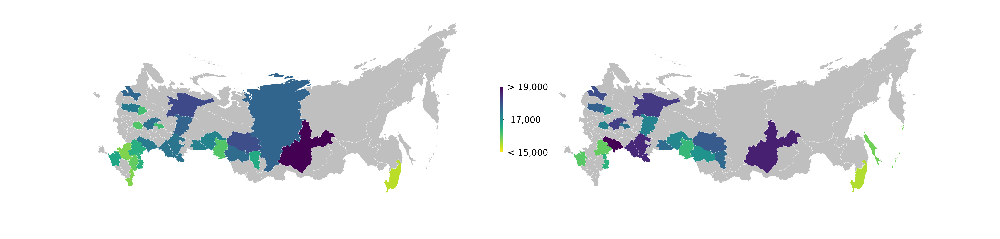

In [183]:
proj = gcrs.AlbersEqualArea(central_longitude=94, central_latitude=60)

f, axarr = plt.subplots(1, 2, figsize=(100, 20), subplot_kw={
    'projection': proj
})

f.subplots_adjust(wspace=-0.15)

gplt.choropleth(
    russia_data_3, hue='Крэк-спред 2013',
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  
    projection=proj,  ax=axarr[0]
)



gplt.choropleth(
    russia_data_3, hue='Крэк-спред 2018',
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  legend = False,  #legend_kwargs={'size':3},
    projection=proj,  ax=axarr[1] 
    
)



sm = plt.cm.ScalarMappable(cmap=newcmp)
sm._A = []

cbar = plt.colorbar(sm, ax=axarr[0], fraction=0.005, pad = -0.05, ticks=[0, 0.5, 1]) #orientation='horizontal',
cbar.ax.set_yticklabels([' < 15,000', '  17,000', ' > 19,000'])  
# cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
cbar.ax.tick_params(labelsize=40);


### Объемы собираемых налоговых платежей (НДПИ, акциз) в региональном разрезе

- [НДПИ](https://ru.wikipedia.org/wiki/%D0%9D%D0%B0%D0%BB%D0%BE%D0%B3_%D0%BD%D0%B0_%D0%B4%D0%BE%D0%B1%D1%8B%D1%87%D1%83_%D0%BF%D0%BE%D0%BB%D0%B5%D0%B7%D0%BD%D1%8B%D1%85_%D0%B8%D1%81%D0%BA%D0%BE%D0%BF%D0%B0%D0%B5%D0%BC%D1%8B%D1%85_%D0%A0%D0%BE%D1%81%D1%81%D0%B8%D1%8F)
- [СТАВКИ АКЦИЗА НА НЕФТЬ И ГАЗОВЫЙ КОНДЕНСАТ ДЛЯ НЕФТЕГАЗОДОБЫВАЮЩИХ ПРЕДПРИЯТИЙ](https://zakonbase.ru/content/part/196311)

-  [Об Оценке влияния налОгОвОгО маневра в нефтянОй сфере на пОтребительскую инфляцию](http://www.cbr.ru/Content/Document/File/59793/20181227.pdf)

In [254]:
russia_data.columns

Index(['ID_0', 'ISO', 'NAME_0', 'ID_1', 'NAME_1', 'TYPE_1', 'ENGTYPE_1',
       'NL_NAME_1', 'VARNAME_1', 'geometry', 'Глубина переработки, %',
       'Выход светлых нефтепродуктов, %', 'Индекс Нельсона', 'ИК',
       'Кратность запасов газа добыче', 'Кратность запасов нефти добыче',
       'Цены на бензин 2013', 'Цены на бензин 2018',
       'Акцизы на нефтепродукты (суб.бюджет) 2014',
       'Акцизы на нефтепродукты (суб.бюджет) 2017', 'НДПИ (нефть) 2014',
       'НДПИ (нефть) 2017', 'Задолженность по НДПИ 2014',
       'Задолженность по НДПИ 2017',
       'Задолженность по акцизу на нефтепродукты 2014',
       'Задолженность по акцизу на нефтепродукты 2017',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017',
       'НДПИ (газ горючий природный) 2014',
       'НДПИ (газ горючий природный) 2017', 'НДПИ (газовый конденсат ) 2014',
       'НДПИ (газовый конденсат 

In [255]:
colnameee = 'НДПИ (нефть) 2014'

In [256]:
# russia_data_2[colnameee][colnameee]<60]

In [257]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [258]:
m0, m05,  m1

(-0.079, 702034.9985, 1404070.076)

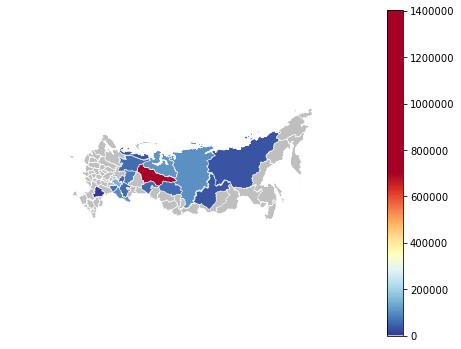

In [239]:
gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [259]:
russia_data_2[colnameee][russia_data_2[colnameee] == 150000] = 250000
# =  19000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [260]:
russia_data_2[colnameee][russia_data_2[colnameee] < 16000]
# = 1.4

0      0.001
1      0.000
2      0.000
3      0.000
4     23.722
       ...  
78     0.000
80     0.000
81     0.000
82     0.000
83     0.000
Name: НДПИ (нефть) 2014, Length: 69, dtype: float64

In [242]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [261]:
m1 = russia_data_3[colnameee].max()
m0 = russia_data_3[colnameee].min()
m05 = (m1+m0)/2

In [262]:
m0, m05,  m1

(-1.186493784290495e-06, 10.543799519932113, 21.08760022635801)

In [264]:
russia_data_2 = russia_data.copy()

In [265]:
replce10 = russia_data_2[colnameee].min() - (russia_data_2[colnameee].max() - russia_data_2[colnameee].min()) * 0.01
russia_data_2[colnameee] = russia_data_2[colnameee].fillna(replce10)
replce10

-14040.780549999998

In [266]:
colnameee = 'НДПИ (нефть) 2017'

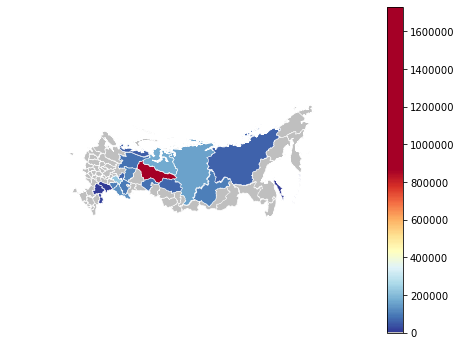

In [267]:
gplt.choropleth(
    russia_data, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [303]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [268]:
russia_data_2[colnameee][russia_data_2[colnameee] > 250000] = 250000
# = 19000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [269]:
russia_data_2[colnameee][russia_data_2[colnameee] < 15000] = 15000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [270]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [271]:
m0, m05,  m1

(15000.0, 132500.0, 250000.0)

In [272]:
replce10 = russia_data_2[colnameee].min() - (russia_data_2[colnameee].max() - russia_data_2[colnameee].min()) * 0.01
russia_data_2[colnameee] = russia_data_2[colnameee].fillna(replce10)
replce10

12650.0

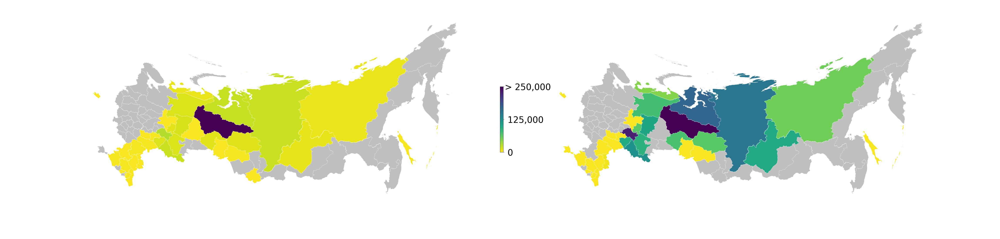

In [273]:
proj = gcrs.AlbersEqualArea(central_longitude=94, central_latitude=60)

f, axarr = plt.subplots(1, 2, figsize=(100, 20), subplot_kw={
    'projection': proj
})

f.subplots_adjust(wspace=-0.15)

gplt.choropleth(
    russia_data_2, hue='НДПИ (нефть) 2014',
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  
    projection=proj,  ax=axarr[0]
)

sm = plt.cm.ScalarMappable(cmap=newcmp)
sm._A = []

cbar = plt.colorbar(sm, ax=axarr[0], fraction=0.005, pad = -0.05, ticks=[0, 0.5, 1]) #orientation='horizontal',
cbar.ax.set_yticklabels([' 0', ' 125,000', '> 250,000'])  
# cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
cbar.ax.tick_params(labelsize=40)



gplt.choropleth(
    russia_data_2, hue='НДПИ (нефть) 2017',
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  legend = False,  #legend_kwargs={'size':3},
    projection=proj,  ax=axarr[1] 
    
);






In [413]:
russia_data.columns

Index(['ID_0', 'ISO', 'NAME_0', 'ID_1', 'NAME_1', 'TYPE_1', 'ENGTYPE_1',
       'NL_NAME_1', 'VARNAME_1', 'geometry', 'Глубина переработки, %',
       'Выход светлых нефтепродуктов, %', 'Индекс Нельсона', 'ИК',
       'Кратность запасов газа добыче', 'Кратность запасов нефти добыче',
       'Цены на бензин 2013', 'Цены на бензин 2018',
       'Акцизы на нефтепродукты (суб.бюджет) 2014',
       'Акцизы на нефтепродукты (суб.бюджет) 2017', 'НДПИ (нефть) 2014',
       'НДПИ (нефть) 2017', 'Задолженность по НДПИ 2014',
       'Задолженность по НДПИ 2017',
       'Задолженность по акцизу на нефтепродукты 2014',
       'Задолженность по акцизу на нефтепродукты 2017',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017',
       'НДПИ (газ горючий природный) 2014',
       'НДПИ (газ горючий природный) 2017', 'НДПИ (газовый конденсат ) 2014',
       'НДПИ (газовый конденсат 

In [274]:
colnameee = 'Акцизы на нефтепродукты (суб.бюджет) 2014'

In [275]:
# russia_data_2[colnameee][colnameee]<60]

In [276]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [277]:
m0, m05,  m1

(-346.093, 16046.764500000005, 32439.62200000001)

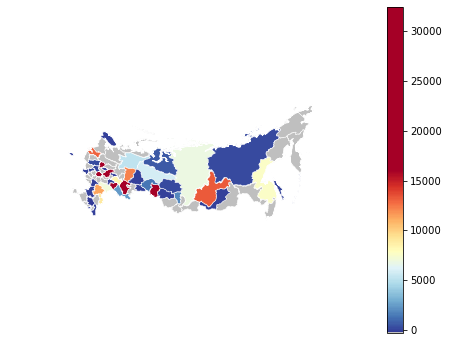

In [278]:
gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [279]:
russia_data_2[colnameee][russia_data_2[colnameee] > 30000] = 30000
# = 250000
# =  19000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [280]:
russia_data_2[colnameee][russia_data_2[colnameee] < -300] = -300
# = 1.4

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [281]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [282]:
m1 = russia_data_3[colnameee].max()
m0 = russia_data_3[colnameee].min()
m05 = (m1+m0)/2

In [283]:
m0, m05,  m1

(-0.05981903569746084, 2.773537686270013, 5.606894408237487)

In [284]:
replce10 = russia_data_2[colnameee].min() - (russia_data_2[colnameee].max() - russia_data_2[colnameee].min()) * 0.01
russia_data_2[colnameee] = russia_data_2[colnameee].fillna(-350)
replce10

-603.0

In [285]:
colnameee = 'Акцизы на нефтепродукты (суб.бюджет) 2017'

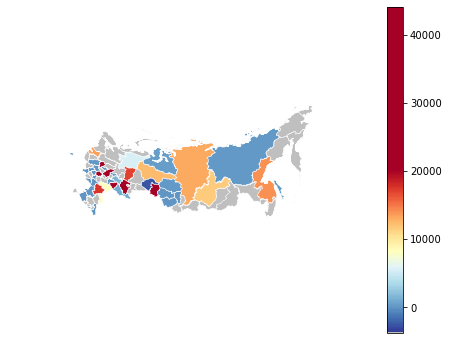

In [286]:
gplt.choropleth(
    russia_data, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [287]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [288]:
russia_data_2[colnameee][russia_data_2[colnameee] > 30000] = 30000
# = 19000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [289]:
russia_data_2[colnameee][russia_data_2[colnameee] < -300] = -300
# = 15000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [290]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [291]:
m0, m05,  m1

(-300.0, 14850.0, 30000.0)

In [293]:
replce10 = russia_data_2[colnameee].min() - (russia_data_2[colnameee].max() - russia_data_2[colnameee].min()) * 0.01
russia_data_2[colnameee] = russia_data_2[colnameee].fillna(-350)
replce10

-603.0

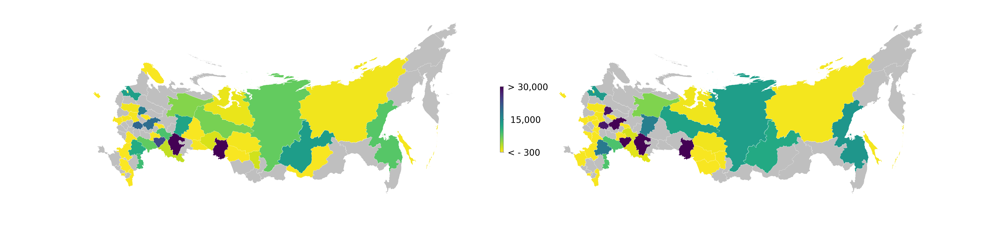

In [294]:
proj = gcrs.AlbersEqualArea(central_longitude=94, central_latitude=60)

f, axarr = plt.subplots(1, 2, figsize=(100, 20), subplot_kw={
    'projection': proj
})

f.subplots_adjust(wspace=-0.15)

gplt.choropleth(
    russia_data_2, hue='Акцизы на нефтепродукты (суб.бюджет) 2014',
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  
    projection=proj,  ax=axarr[0]
)

sm = plt.cm.ScalarMappable(cmap=newcmp)
sm._A = []

cbar = plt.colorbar(sm, ax=axarr[0], fraction=0.005, pad = -0.05, ticks=[0, 0.5, 1]) #orientation='horizontal',
cbar.ax.set_yticklabels([' < - 300', '  15,000', ' > 30,000'])  
# cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
cbar.ax.tick_params(labelsize=40)



gplt.choropleth(
    russia_data_2, hue='Акцизы на нефтепродукты (суб.бюджет) 2017',
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  legend = False,  #legend_kwargs={'size':3},
    projection=proj,  ax=axarr[1] 
    
);






In [413]:
russia_data.columns

Index(['ID_0', 'ISO', 'NAME_0', 'ID_1', 'NAME_1', 'TYPE_1', 'ENGTYPE_1',
       'NL_NAME_1', 'VARNAME_1', 'geometry', 'Глубина переработки, %',
       'Выход светлых нефтепродуктов, %', 'Индекс Нельсона', 'ИК',
       'Кратность запасов газа добыче', 'Кратность запасов нефти добыче',
       'Цены на бензин 2013', 'Цены на бензин 2018',
       'Акцизы на нефтепродукты (суб.бюджет) 2014',
       'Акцизы на нефтепродукты (суб.бюджет) 2017', 'НДПИ (нефть) 2014',
       'НДПИ (нефть) 2017', 'Задолженность по НДПИ 2014',
       'Задолженность по НДПИ 2017',
       'Задолженность по акцизу на нефтепродукты 2014',
       'Задолженность по акцизу на нефтепродукты 2017',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017',
       'НДПИ (газ горючий природный) 2014',
       'НДПИ (газ горючий природный) 2017', 'НДПИ (газовый конденсат ) 2014',
       'НДПИ (газовый конденсат 

In [514]:
colnameee = 'Акцизы на нефтепродукты (факт. 2016 г. )'

In [504]:
# russia_data_2[colnameee][colnameee]<60]

In [505]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [506]:
m0, m05,  m1

(0.0, 12810.05836257, 25620.11672514)

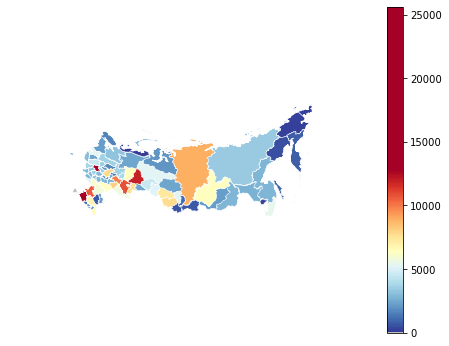

In [507]:
gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [516]:
russia_data_2[colnameee][russia_data_2[colnameee] > 16000] = 16000
# =  19000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [382]:
russia_data_2[colnameee][russia_data_2[colnameee] < 16000]
# = 1.4

55    15901.810715
59    15316.181604
Name: Крэк-спред 2013, dtype: float64

In [255]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [360]:
m1 = russia_data_3[colnameee].max()
m0 = russia_data_3[colnameee].min()
m05 = (m1+m0)/2

In [361]:
m0, m05,  m1

(0.9, 1.15, 1.4)

In [517]:
colnameee = 'Акцизы на нефтепродукты (Прогноз 2017 г.)'

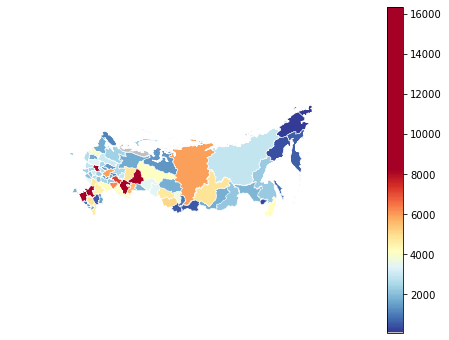

In [509]:
gplt.choropleth(
    russia_data, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [303]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [519]:
russia_data_2[colnameee][russia_data_2[colnameee] > 16000] = 16000
# = 19000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [528]:
russia_data_2[colnameee][russia_data_2[colnameee] < 100] = 0
# = 0

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [512]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [513]:
m0, m05,  m1

(75.9384868450725, 8213.506737163038, 16351.074987481)

In [410]:
(30+46)/2

38.0

In [530]:
viridis = cm.get_cmap('viridis', 256)
newcolors = viridis(np.linspace(1, 0, 256))
# grey = np.array([192/256, 192/256, 192/256, 1])
# newcolors[:1, :] = grey
newcmp = ListedColormap(newcolors)

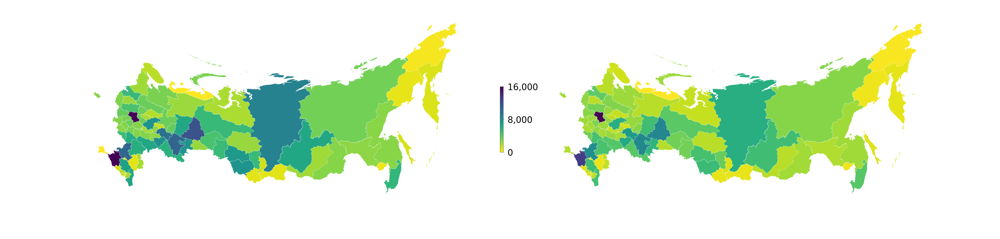

In [531]:
proj = gcrs.AlbersEqualArea(central_longitude=94, central_latitude=60)

f, axarr = plt.subplots(1, 2, figsize=(100, 20), subplot_kw={
    'projection': proj
})

f.subplots_adjust(wspace=-0.15)

gplt.choropleth(
    russia_data_2, hue='Акцизы на нефтепродукты (факт. 2016 г. )',
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  
    projection=proj,  ax=axarr[0]
)

sm = plt.cm.ScalarMappable(cmap=newcmp)
sm._A = []

cbar = plt.colorbar(sm, ax=axarr[0], fraction=0.005, pad = -0.05, ticks=[0, 0.5, 1]) #orientation='horizontal',
cbar.ax.set_yticklabels([' 0', ' 8,000', ' 16,000'])  
# cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
cbar.ax.tick_params(labelsize=40)



gplt.choropleth(
    russia_data_2, hue='Акцизы на нефтепродукты (Прогноз 2017 г.)',
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  legend = False,  #legend_kwargs={'size':3},
    projection=proj,  ax=axarr[1] 
    
);






In [532]:
viridis = cm.get_cmap('viridis', 256)
newcolors = viridis(np.linspace(1, 0, 256))
grey = np.array([192/256, 192/256, 192/256, 1])
newcolors[:1, :] = grey
newcmp = ListedColormap(newcolors)

### Задолженность по налоговым платежам (НДПИ, акциз) в региональном разрезе

- [ВИЗУАЛИЗАЦИЯ ДАННЫХ, ХАРАКТЕРИЗУЮЩИХ НАЛОГОВУЮ КУЛЬТУРУ В НЕФТЕГАЗОВОМ СЕКТОРЕ](https://wciom.ru/fileadmin/file/monitoring/2016/134/2016_134_10_Karibekova.pdf)

In [295]:
russia_data.columns

Index(['ID_0', 'ISO', 'NAME_0', 'ID_1', 'NAME_1', 'TYPE_1', 'ENGTYPE_1',
       'NL_NAME_1', 'VARNAME_1', 'geometry', 'Глубина переработки, %',
       'Выход светлых нефтепродуктов, %', 'Индекс Нельсона', 'ИК',
       'Кратность запасов газа добыче', 'Кратность запасов нефти добыче',
       'Цены на бензин 2013', 'Цены на бензин 2018',
       'Акцизы на нефтепродукты (суб.бюджет) 2014',
       'Акцизы на нефтепродукты (суб.бюджет) 2017', 'НДПИ (нефть) 2014',
       'НДПИ (нефть) 2017', 'Задолженность по НДПИ 2014',
       'Задолженность по НДПИ 2017',
       'Задолженность по акцизу на нефтепродукты 2014',
       'Задолженность по акцизу на нефтепродукты 2017',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017',
       'НДПИ (газ горючий природный) 2014',
       'НДПИ (газ горючий природный) 2017', 'НДПИ (газовый конденсат ) 2014',
       'НДПИ (газовый конденсат 

In [296]:
colnameee = 'Задолженность по НДПИ 2014'

In [534]:
# russia_data_2[colnameee][colnameee]<60]

In [297]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [298]:
m0, m05,  m1

(0.002, 593.9789999999999, 1187.956)

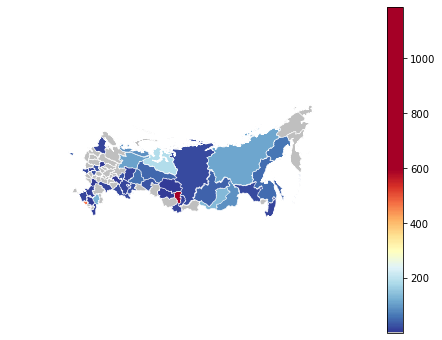

In [537]:
gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [299]:
russia_data_2[colnameee][russia_data_2[colnameee] > 500] = 500
# = 30000
# = 250000
# =  19000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [300]:
russia_data_2[colnameee][russia_data_2[colnameee] < -300] = -300
# = 1.4

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [301]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [302]:
m1 = russia_data_3[colnameee].max()
m0 = russia_data_3[colnameee].min()
m05 = (m1+m0)/2

In [303]:
m0, m05,  m1

(4.2937737952019925e-05, 12.75205732550142, 25.50407171326489)

In [552]:
colnameee = 'Задолженность по НДПИ 2017'

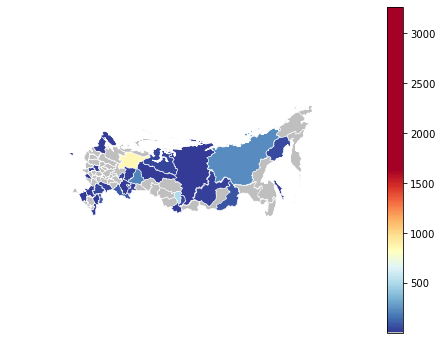

In [539]:
gplt.choropleth(
    russia_data, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [303]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [553]:
russia_data_2[colnameee][russia_data_2[colnameee] > 500] = 500
# = 19000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [499]:
russia_data_2[colnameee][russia_data_2[colnameee] < -300] = -300
# = 15000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [540]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [541]:
m0, m05,  m1

(0.002, 1634.4795000000006, 3268.9570000000012)

In [542]:
(30+46)/2

38.0

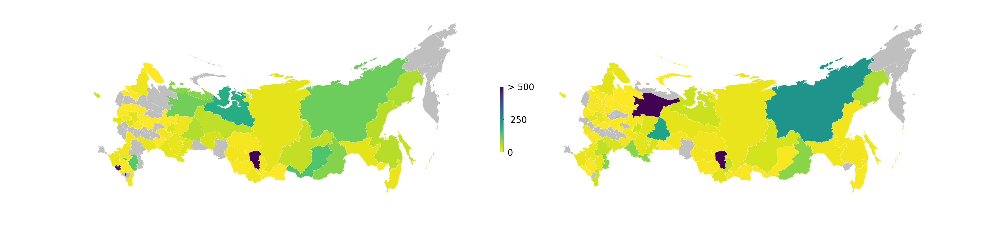

In [554]:
proj = gcrs.AlbersEqualArea(central_longitude=94, central_latitude=60)

f, axarr = plt.subplots(1, 2, figsize=(100, 20), subplot_kw={
    'projection': proj
})

f.subplots_adjust(wspace=-0.15)

gplt.choropleth(
    russia_data_2, hue='Задолженность по НДПИ 2014',
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  
    projection=proj,  ax=axarr[0]
)

sm = plt.cm.ScalarMappable(cmap=newcmp)
sm._A = []

cbar = plt.colorbar(sm, ax=axarr[0], fraction=0.005, pad = -0.05, ticks=[0, 0.5, 1]) #orientation='horizontal',
cbar.ax.set_yticklabels([' 0', '  250', ' > 500'])  
# cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
cbar.ax.tick_params(labelsize=40)



gplt.choropleth(
    russia_data_2, hue='Задолженность по НДПИ 2017',
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  legend = False,  #legend_kwargs={'size':3},
    projection=proj,  ax=axarr[1] 
    
);






In [413]:
russia_data.columns

Index(['ID_0', 'ISO', 'NAME_0', 'ID_1', 'NAME_1', 'TYPE_1', 'ENGTYPE_1',
       'NL_NAME_1', 'VARNAME_1', 'geometry', 'Глубина переработки, %',
       'Выход светлых нефтепродуктов, %', 'Индекс Нельсона', 'ИК',
       'Кратность запасов газа добыче', 'Кратность запасов нефти добыче',
       'Цены на бензин 2013', 'Цены на бензин 2018',
       'Акцизы на нефтепродукты (суб.бюджет) 2014',
       'Акцизы на нефтепродукты (суб.бюджет) 2017', 'НДПИ (нефть) 2014',
       'НДПИ (нефть) 2017', 'Задолженность по НДПИ 2014',
       'Задолженность по НДПИ 2017',
       'Задолженность по акцизу на нефтепродукты 2014',
       'Задолженность по акцизу на нефтепродукты 2017',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017',
       'НДПИ (газ горючий природный) 2014',
       'НДПИ (газ горючий природный) 2017', 'НДПИ (газовый конденсат ) 2014',
       'НДПИ (газовый конденсат 

In [575]:
colnameee = 'Задолженность по акцизу на нефтепродукты 2014'

In [556]:
# russia_data_2[colnameee][colnameee]<60]

In [557]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [558]:
m0, m05,  m1

(0.002, 319.7780000000001, 639.5540000000002)

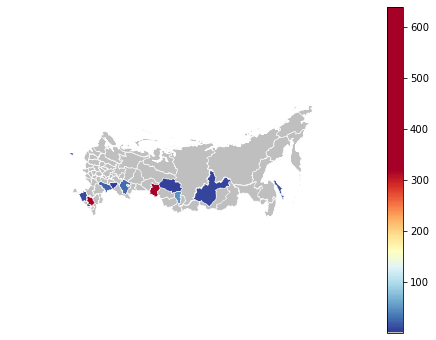

In [559]:
gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [568]:
russia_data_2[colnameee][russia_data_2[colnameee] > 500] = 500
# = 30000
# = 250000
# =  19000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [576]:
russia_data_2[colnameee][russia_data_2[colnameee].isna()] = -5

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [496]:
russia_data_2[colnameee][russia_data_2[colnameee] < -300] = -300
# = 1.4

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [255]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [360]:
m1 = russia_data_3[colnameee].max()
m0 = russia_data_3[colnameee].min()
m05 = (m1+m0)/2

In [361]:
m0, m05,  m1

(0.9, 1.15, 1.4)

In [569]:
colnameee = 'Задолженность по акцизу на нефтепродукты 2017'

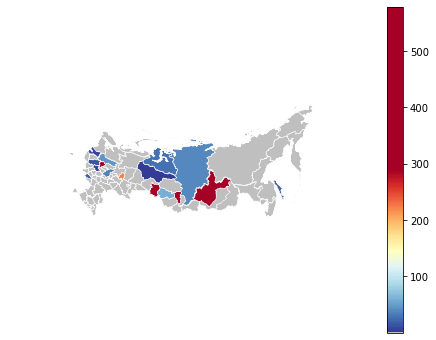

In [561]:
gplt.choropleth(
    russia_data, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [303]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [570]:
russia_data_2[colnameee][russia_data_2[colnameee] > 500] = 500
# = 19000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [499]:
russia_data_2[colnameee][russia_data_2[colnameee] < -300] = -300
# = 15000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [562]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [563]:
m0, m05,  m1

(0.002, 289.49649999999997, 578.991)

In [410]:
(30+46)/2

38.0

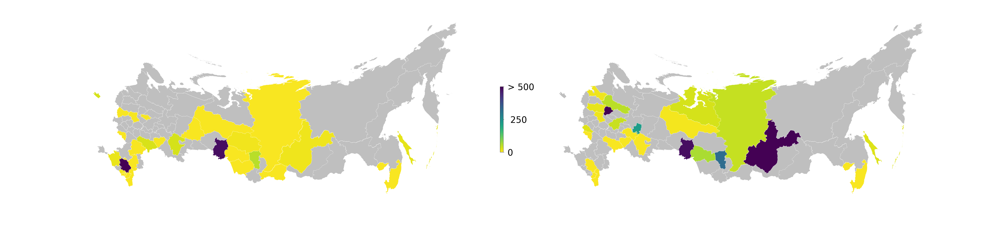

In [577]:
proj = gcrs.AlbersEqualArea(central_longitude=94, central_latitude=60)

f, axarr = plt.subplots(1, 2, figsize=(100, 20), subplot_kw={
    'projection': proj
})

f.subplots_adjust(wspace=-0.15)

gplt.choropleth(
    russia_data_2, hue='Задолженность по акцизу на нефтепродукты 2014',
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  
    projection=proj,  ax=axarr[0]
)

sm = plt.cm.ScalarMappable(cmap=newcmp)
sm._A = []

cbar = plt.colorbar(sm, ax=axarr[0], fraction=0.005, pad = -0.05, ticks=[0, 0.5, 1]) #orientation='horizontal',
cbar.ax.set_yticklabels([' 0', '  250', ' > 500'])  
# cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
cbar.ax.tick_params(labelsize=40)



gplt.choropleth(
    russia_data_2, hue='Задолженность по акцизу на нефтепродукты 2017',
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  legend = False,  #legend_kwargs={'size':3},
    projection=proj,  ax=axarr[1] 
    
);






In [413]:
russia_data.columns

Index(['ID_0', 'ISO', 'NAME_0', 'ID_1', 'NAME_1', 'TYPE_1', 'ENGTYPE_1',
       'NL_NAME_1', 'VARNAME_1', 'geometry', 'Глубина переработки, %',
       'Выход светлых нефтепродуктов, %', 'Индекс Нельсона', 'ИК',
       'Кратность запасов газа добыче', 'Кратность запасов нефти добыче',
       'Цены на бензин 2013', 'Цены на бензин 2018',
       'Акцизы на нефтепродукты (суб.бюджет) 2014',
       'Акцизы на нефтепродукты (суб.бюджет) 2017', 'НДПИ (нефть) 2014',
       'НДПИ (нефть) 2017', 'Задолженность по НДПИ 2014',
       'Задолженность по НДПИ 2017',
       'Задолженность по акцизу на нефтепродукты 2014',
       'Задолженность по акцизу на нефтепродукты 2017',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017',
       'НДПИ (газ горючий природный) 2014',
       'НДПИ (газ горючий природный) 2017', 'НДПИ (газовый конденсат ) 2014',
       'НДПИ (газовый конденсат 

In [593]:
colnameee = 'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014'

In [594]:
# russia_data_2[colnameee][colnameee]<60]
russia_data_2[colnameee][russia_data_2[colnameee].isna()] = -5

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [580]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [581]:
m0, m05,  m1

(0.001, 407.68249999999983, 815.3639999999997)

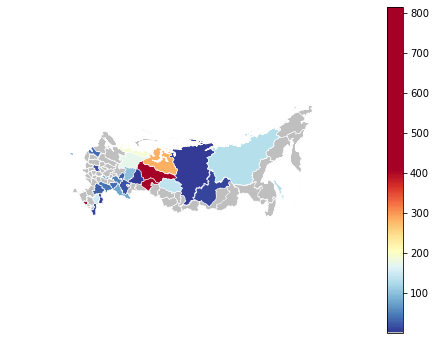

In [582]:
gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [591]:
russia_data_2[colnameee][russia_data_2[colnameee] > 800] = 1000
# = 30000
# = 19000
# =  19000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [496]:
russia_data_2[colnameee][russia_data_2[colnameee] < -300] = -300
# = 1.4

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [255]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [360]:
m1 = russia_data_3[colnameee].max()
m0 = russia_data_3[colnameee].min()
m05 = (m1+m0)/2

In [361]:
m0, m05,  m1

(0.9, 1.15, 1.4)

In [595]:
colnameee = 'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017'

russia_data_2[colnameee][russia_data_2[colnameee].isna()] = -5

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


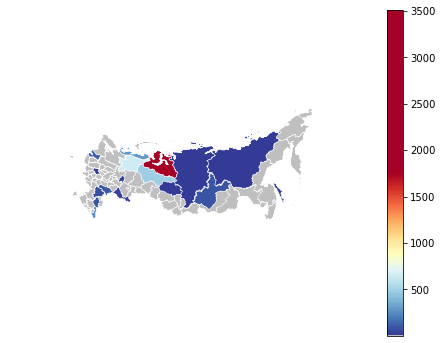

In [584]:
gplt.choropleth(
    russia_data, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [303]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [589]:
russia_data_2[colnameee][russia_data_2[colnameee] > 800] = 1000
# = 30000
# = 19000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [499]:
russia_data_2[colnameee][russia_data_2[colnameee] < -300] = -300
# = 15000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [585]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [586]:
m0, m05,  m1

(0.001, 1757.6620000000007, 3515.3230000000012)

In [410]:
(30+46)/2

38.0

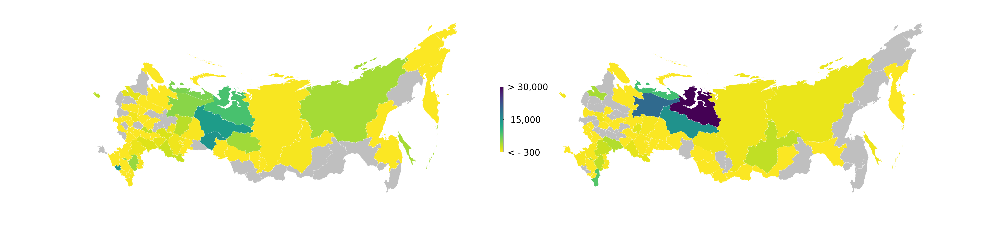

In [596]:
proj = gcrs.AlbersEqualArea(central_longitude=94, central_latitude=60)

f, axarr = plt.subplots(1, 2, figsize=(100, 20), subplot_kw={
    'projection': proj
})

f.subplots_adjust(wspace=-0.15)

gplt.choropleth(
    russia_data_2, hue='Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014',
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  
    projection=proj,  ax=axarr[0]
)

sm = plt.cm.ScalarMappable(cmap=newcmp)
sm._A = []

cbar = plt.colorbar(sm, ax=axarr[0], fraction=0.005, pad = -0.05, ticks=[0, 0.5, 1]) #orientation='horizontal',
cbar.ax.set_yticklabels([' < - 300', '  15,000', ' > 30,000'])  
# cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
cbar.ax.tick_params(labelsize=40)



gplt.choropleth(
    russia_data_2, hue='Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017',
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  legend = False,  #legend_kwargs={'size':3},
    projection=proj,  ax=axarr[1] 
    
);






## Аналитические показатели для рынка газа

### Отношение между объемом запасов и объемом добычи в региональном разрезе

- [Use of Statistical Indicators to Measure Crude Oil and Natural Gas Reserves and Production ](http://www.upg-bulletin-se.ro/archive/2014-1/5.Lazar_Lazar.pdf)

-  [Воспроизводство минерально-сырьевой базы нефтегазового комплекса России](https://cyberleninka.ru/article/v/vosproizvodstvo-mineralno-syrievoy-bazy-neftegazovogo-kompleksa-rossii)


In [217]:
russia_data_2.columns

Index(['ID_0', 'ISO', 'NAME_0', 'ID_1', 'NAME_1', 'TYPE_1', 'ENGTYPE_1',
       'NL_NAME_1', 'VARNAME_1', 'geometry', 'Глубина переработки, %',
       'Выход светлых нефтепродуктов, %', 'Индекс Нельсона', 'ИК',
       'Кратность запасов газа добыче', 'Кратность запасов нефти добыче',
       'Цены на бензин 2013', 'Цены на бензин 2018',
       'Акцизы на нефтепродукты (суб.бюджет) 2014',
       'Акцизы на нефтепродукты (суб.бюджет) 2017', 'НДПИ (нефть) 2014',
       'НДПИ (нефть) 2017', 'Задолженность по НДПИ 2014',
       'Задолженность по НДПИ 2017',
       'Задолженность по акцизу на нефтепродукты 2014',
       'Задолженность по акцизу на нефтепродукты 2017',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017',
       'НДПИ (газ горючий природный) 2014',
       'НДПИ (газ горючий природный) 2017', 'НДПИ (газовый конденсат ) 2014',
       'НДПИ (газовый конденсат 

In [218]:
colnameee = 'Кратность запасов газа добыче'

In [223]:
russia_data_2[colnameee][russia_data_2[colnameee]>1000] = 1000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [153]:
# russia_data_2[colnameee] = np.exp(russia_data_2[colnameee])

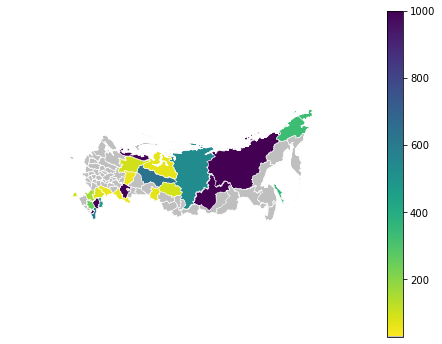

In [162]:
gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [129]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [220]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [221]:
m0, m05,  m1

(0.0, 5617.85, 11235.7)

In [214]:
# russia_data.co
russia_data_2 = russia_data.copy()

In [222]:
replce10 = russia_data_2[colnameee].min() - (russia_data_2[colnameee].max() - russia_data_2[colnameee].min()) * 0.01
russia_data_2[colnameee] = russia_data_2[colnameee].fillna(0)
replce10

-112.35700000000001

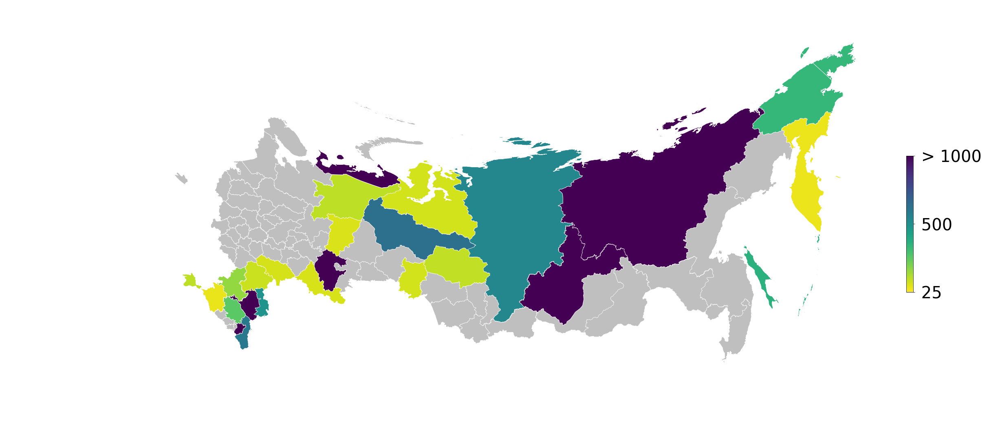

In [224]:
proj = gcrs.AlbersEqualArea(central_longitude=94, central_latitude=60)

f, axarr = plt.subplots(1, 1, figsize=(100, 20), subplot_kw={
    'projection': proj
})

f.subplots_adjust(wspace=0)

gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=newcmp, linewidth=0.8, edgecolor='white', k=None,  
    projection=proj,  ax=axarr
)

sm = plt.cm.ScalarMappable(cmap=newcmp)
sm._A = []

cbar = plt.colorbar(sm,  fraction=0.003, pad = -0.04, ticks=[0, 0.5, 1]) #orientation='horizontal',
cbar.ax.set_yticklabels([' 25', ' 500', ' > 1000'])  
# cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
cbar.ax.tick_params(labelsize=40)

# gplt.choropleth(
#     russia_data_2, hue='Глубина переработки, %',
#     cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  legend = False,  #legend_kwargs={'size':3},
#     projection=proj,  ax=axarr[1] 
    
# )
# plt.savefig('foo1.png')

### Объемы собираемых налоговых платежей (НДПИ) в региональном разрезе

- [О ставках акциза на природный газ
](http://pravo.gov.ru/proxy/ips/?docbody=&nd=102057751&rdk=1)

Акциз не  уплачивается организациями, передающими   или
реализующими на  территории  Российской  Федерации  природный  газ,
приобретенный   и  реализованный  по  государственным  регулируемым
оптовым ценам,  акциз на который уже  был  уплачен  поставщиками  в
установленном    порядке    исходя    из   налогооблагаемой   базы,
предусмотренной в абзаце втором настоящего пункта.

In [413]:
russia_data.columns

Index(['ID_0', 'ISO', 'NAME_0', 'ID_1', 'NAME_1', 'TYPE_1', 'ENGTYPE_1',
       'NL_NAME_1', 'VARNAME_1', 'geometry', 'Глубина переработки, %',
       'Выход светлых нефтепродуктов, %', 'Индекс Нельсона', 'ИК',
       'Кратность запасов газа добыче', 'Кратность запасов нефти добыче',
       'Цены на бензин 2013', 'Цены на бензин 2018',
       'Акцизы на нефтепродукты (суб.бюджет) 2014',
       'Акцизы на нефтепродукты (суб.бюджет) 2017', 'НДПИ (нефть) 2014',
       'НДПИ (нефть) 2017', 'Задолженность по НДПИ 2014',
       'Задолженность по НДПИ 2017',
       'Задолженность по акцизу на нефтепродукты 2014',
       'Задолженность по акцизу на нефтепродукты 2017',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017',
       'НДПИ (газ горючий природный) 2014',
       'НДПИ (газ горючий природный) 2017', 'НДПИ (газовый конденсат ) 2014',
       'НДПИ (газовый конденсат 

In [451]:
colnameee = 'НДПИ (газ горючий природный) 2014'

In [436]:
# russia_data_2[colnameee][colnameee]<60]

In [437]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [438]:
m0, m05,  m1

(0.008, 164664.87649999998, 329329.745)

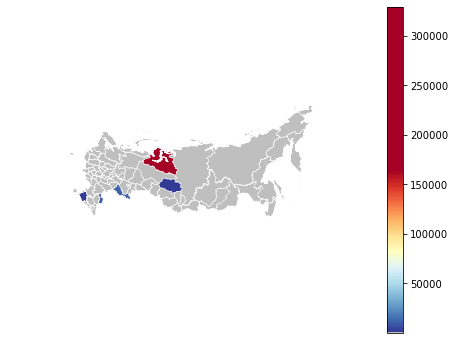

In [439]:
gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [454]:
russia_data_2[colnameee][russia_data_2[colnameee] > 20000] = 20000
# = 250000
# =  19000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [382]:
russia_data_2[colnameee][russia_data_2[colnameee] < 16000]
# = 1.4

55    15901.810715
59    15316.181604
Name: Крэк-спред 2013, dtype: float64

In [255]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [360]:
m1 = russia_data_3[colnameee].max()
m0 = russia_data_3[colnameee].min()
m05 = (m1+m0)/2

In [361]:
m0, m05,  m1

(0.9, 1.15, 1.4)

In [455]:
colnameee = 'НДПИ (газ горючий природный) 2017'

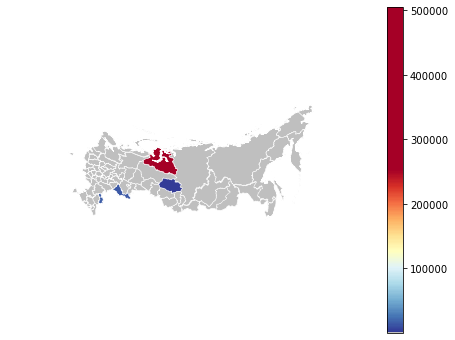

In [441]:
gplt.choropleth(
    russia_data, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [303]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [457]:
russia_data_2[colnameee][russia_data_2[colnameee] > 20000] = 20000
# = 19000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [387]:
russia_data_2[colnameee][russia_data_2[colnameee] < 15000] = 15000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [442]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [443]:
m0, m05,  m1

(1.169, 252804.1695, 505607.17)

In [410]:
(30+46)/2

38.0

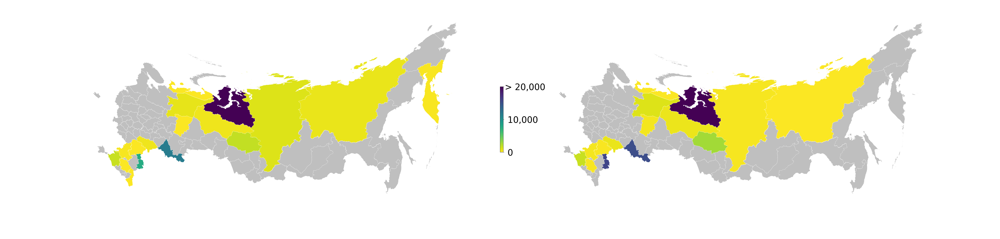

In [459]:
proj = gcrs.AlbersEqualArea(central_longitude=94, central_latitude=60)

f, axarr = plt.subplots(1, 2, figsize=(100, 20), subplot_kw={
    'projection': proj
})

f.subplots_adjust(wspace=-0.15)

gplt.choropleth(
    russia_data_2, hue='НДПИ (газ горючий природный) 2014',
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  
    projection=proj,  ax=axarr[0]
)

sm = plt.cm.ScalarMappable(cmap=newcmp)
sm._A = []

cbar = plt.colorbar(sm, ax=axarr[0], fraction=0.005, pad = -0.05, ticks=[0, 0.5, 1]) #orientation='horizontal',
cbar.ax.set_yticklabels([' 0', ' 10,000', '> 20,000'])  
# cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
cbar.ax.tick_params(labelsize=40)



gplt.choropleth(
    russia_data_2, hue='НДПИ (газ горючий природный) 2017',
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  legend = False,  #legend_kwargs={'size':3},
    projection=proj,  ax=axarr[1] 
    
);






In [413]:
russia_data.columns

Index(['ID_0', 'ISO', 'NAME_0', 'ID_1', 'NAME_1', 'TYPE_1', 'ENGTYPE_1',
       'NL_NAME_1', 'VARNAME_1', 'geometry', 'Глубина переработки, %',
       'Выход светлых нефтепродуктов, %', 'Индекс Нельсона', 'ИК',
       'Кратность запасов газа добыче', 'Кратность запасов нефти добыче',
       'Цены на бензин 2013', 'Цены на бензин 2018',
       'Акцизы на нефтепродукты (суб.бюджет) 2014',
       'Акцизы на нефтепродукты (суб.бюджет) 2017', 'НДПИ (нефть) 2014',
       'НДПИ (нефть) 2017', 'Задолженность по НДПИ 2014',
       'Задолженность по НДПИ 2017',
       'Задолженность по акцизу на нефтепродукты 2014',
       'Задолженность по акцизу на нефтепродукты 2017',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017',
       'НДПИ (газ горючий природный) 2014',
       'НДПИ (газ горючий природный) 2017', 'НДПИ (газовый конденсат ) 2014',
       'НДПИ (газовый конденсат 

In [470]:
colnameee = 'НДПИ (газовый конденсат ) 2014'

In [461]:
# russia_data_2[colnameee][colnameee]<60]

In [462]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [463]:
m0, m05,  m1

(-48.653999999999996, 5747.999, 11544.652)

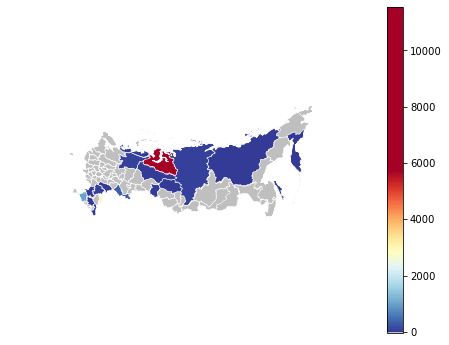

In [464]:
gplt.choropleth(
    russia_data_2, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [472]:
russia_data_2[colnameee][russia_data_2[colnameee] > 3000] = 3000
# = 250000
# =  19000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [382]:
russia_data_2[colnameee][russia_data_2[colnameee] < 16000]
# = 1.4

55    15901.810715
59    15316.181604
Name: Крэк-спред 2013, dtype: float64

In [255]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [360]:
m1 = russia_data_3[colnameee].max()
m0 = russia_data_3[colnameee].min()
m05 = (m1+m0)/2

In [361]:
m0, m05,  m1

(0.9, 1.15, 1.4)

In [473]:
colnameee = 'НДПИ (газовый конденсат ) 2017'

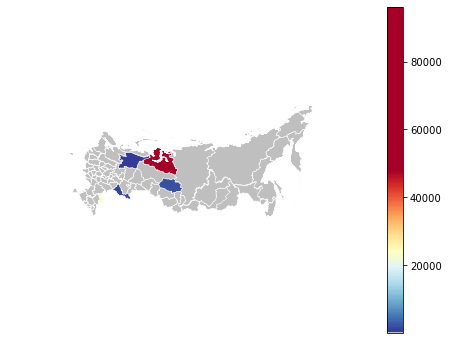

In [466]:
gplt.choropleth(
    russia_data, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [303]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [474]:
russia_data_2[colnameee][russia_data_2[colnameee] > 3000] = 3000
# = 19000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [387]:
russia_data_2[colnameee][russia_data_2[colnameee] < 15000] = 15000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [467]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [468]:
m0, m05,  m1

(0.168, 48090.744000000006, 96181.32)

In [410]:
(30+46)/2

38.0

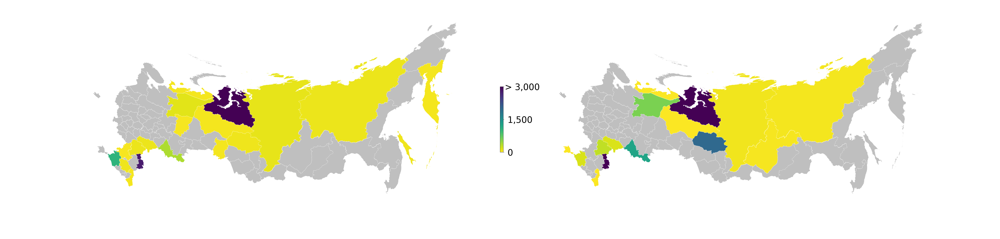

In [476]:
proj = gcrs.AlbersEqualArea(central_longitude=94, central_latitude=60)

f, axarr = plt.subplots(1, 2, figsize=(100, 20), subplot_kw={
    'projection': proj
})

f.subplots_adjust(wspace=-0.15)

gplt.choropleth(
    russia_data_2, hue='НДПИ (газовый конденсат ) 2014',
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  
    projection=proj,  ax=axarr[0]
)

sm = plt.cm.ScalarMappable(cmap=newcmp)
sm._A = []

cbar = plt.colorbar(sm, ax=axarr[0], fraction=0.005, pad = -0.05, ticks=[0, 0.5, 1]) #orientation='horizontal',
cbar.ax.set_yticklabels([' 0', ' 1,500', '> 3,000'])  
# cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
cbar.ax.tick_params(labelsize=40)



gplt.choropleth(
    russia_data_2, hue='НДПИ (газовый конденсат ) 2017',
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  legend = False,  #legend_kwargs={'size':3},
    projection=proj,  ax=axarr[1] 
    
);






## Аналитические показатели для рынка электроэнергетики

- [ГИС энергосбережение](https://gisee.ru/regionsupport/)

### Спарк-спред

Генераторы, работающие на других видах топлива, имеют аналогичные показатели -- дарк-спред (цена на электроэнергию за вычетом стоимости угля) для угольных генераторов, кварк-спред (цена на электроэнергию за вычетом стоимости обогащенного уранового топлива) для ядерных генераторов. Основная цель использования этих спредов – моделирование  экономики производства электроэнергии. 


1 мегаватт равно 0.859845 Гигакалорий в час

https://www.eia.gov/todayinenergy/detail.php?id=9911

- [Спарк-спред](http://www.fondovik.com/bazovie-znaniya/stati-finansovie-instrumenti/fyuchersnie-spredi/spark-spred/)

- [РСВ на покупку ЭЭ](http://www.atsenergo.ru/results/rsv/statistics?period=3) -  Рынок на сутки вперед (РСВ) 
    - [Участникам оптового рынка](http://www.atsenergo.ru/uchastnikam-optovogo-rynka)
- [Тарифы на электроэнергию для населения в России](https://energybase.ru/tariff/electricity)
- [Тарифы на электроэнергию по субъектам Российской Федерации на 2018 год в рублях за кВт*ч (сводная таблица)](https://worknet-info.ru/read-blog/1142_%D1%82%D0%B0%D0%B1%D0%BB%D0%B8%D1%86%D0%B0-%D1%82%D0%B0%D1%80%D0%B8%D1%84%D0%BE%D0%B2-%D0%BD%D0%B0-%D1%8D%D0%BB%D0%B5%D0%BA%D1%82%D1%80%D0%BE%D1%8D%D0%BD%D0%B5%D1%80%D0%B3%D0%B8%D1%8E-%D0%BF%D0%BE-%D1%80%D0%B5%D0%B3%D0%B8%D0%BE%D0%BD%D0%B0%D0%BC-%D1%80%D0%BE%D1%81%D1%81%D0%B8%D0%B8-%D0%B2-2018-%D0%B3%D0%BE%D0%B4%D1%83.html)

[Heat rate](https://en.wikipedia.org/wiki/Heat_rate_(efficiency):

- [Heat Rate](https://data.austintexas.gov/stories/s/Heat-Rate/h4dw-35vc/)
- [NPHR formula](https://www.powermag.com/understanding-coal-power-plant-heat-rate-and-efficiency/?pagenum=3)
- [Heat Rate = Input/Otput](https://www.myodesie.com/wiki/index/returnEntry/id/2995)
- [Определение энергетической эффективности аппаратов, установок и систем](http://www.energosovet.ru/stat616.html)

- [Сравнительные характеристики ТЭС разного типа и АЭС](https://lesprominform.ru/jarticles.html?id=3418)

- [Сравнение различных видов топлива](http://biopechi.ru/stati/sravnenie-razlichnykh-vidov-topliva/)

- [нормативы](https://zakonbase.ru/content/part/613281)

- [Средний удельный расход - топливо](https://www.ngpedia.ru/id380315p1.html)

- [Экономия ушла в полезный отпуск ](https://rg.ru/2019/03/04/rashod-topliva-pri-vyrabotke-elektroenergii-v-rossii-snizilsia.html)

руб за 1000 м3 = руб за  7 900 000  ккал

руб за 1000 м3 = руб за  7 900 000  000 кал

3000 за 7 900 000 000
x за 1 000 000 000

х = цена * 1 000 000 000 / 7 900 000 000

х = цена * 1 000   / 7 900  

7900  ккал/м3  *  руб за 1000 м3

Собрать цены на уголь (среднее по углям??)

- http://www.gks.ru/dbscripts/cbsd/

In [225]:
russia_data.columns

Index(['ID_0', 'ISO', 'NAME_0', 'ID_1', 'NAME_1', 'TYPE_1', 'ENGTYPE_1',
       'NL_NAME_1', 'VARNAME_1', 'geometry', 'Глубина переработки, %',
       'Выход светлых нефтепродуктов, %', 'Индекс Нельсона', 'ИК',
       'Кратность запасов газа добыче', 'Кратность запасов нефти добыче',
       'Цены на бензин 2013', 'Цены на бензин 2018',
       'Акцизы на нефтепродукты (суб.бюджет) 2014',
       'Акцизы на нефтепродукты (суб.бюджет) 2017', 'НДПИ (нефть) 2014',
       'НДПИ (нефть) 2017', 'Задолженность по НДПИ 2014',
       'Задолженность по НДПИ 2017',
       'Задолженность по акцизу на нефтепродукты 2014',
       'Задолженность по акцизу на нефтепродукты 2017',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2014',
       'Задолженность по налогам и сборам в добыче сырой нефти и природного газа 2017',
       'НДПИ (газ горючий природный) 2014',
       'НДПИ (газ горючий природный) 2017', 'НДПИ (газовый конденсат ) 2014',
       'НДПИ (газовый конденсат 

In [226]:
colnameee = 'Спарк-спред 2012'

In [227]:
# russia_data_2[colnameee][colnameee]<60]

In [228]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [229]:
m0, m05,  m1

(1620.4083333333335, 2262.8787500000003, 2905.349166666667)

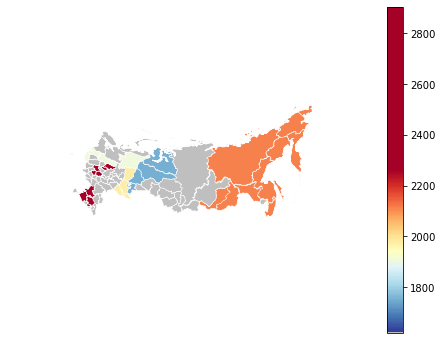

In [398]:
gplt.choropleth(
    russia_data, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [233]:
russia_data_2[colnameee][russia_data_2[colnameee] > 19000] 
# =  19000

Series([], Name: Спарк-спред 2012, dtype: float64)

In [231]:
russia_data_2[colnameee][russia_data_2[colnameee] < 16000]
# = 1.4

2     2113.906667
5     1980.889167
8     2113.906667
10    1755.347500
11    2113.906667
13    1910.164167
18    2660.592500
19    2905.349167
20    1910.164167
23    2113.906667
27    2113.906667
29    1755.347500
31    1910.164167
32    2660.592500
33    2845.985833
34    1620.408333
37    1910.164167
39    2113.906667
43    2660.592500
50    1620.408333
52    1980.889167
54    1980.889167
55    2113.906667
56    1910.164167
57    2845.985833
58    2660.592500
59    2113.906667
60    2113.906667
64    2905.349167
65    1755.347500
68    1620.408333
69    2660.592500
77    1910.164167
79    1755.347500
82    2113.906667
Name: Спарк-спред 2012, dtype: float64

In [255]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [360]:
m1 = russia_data_3[colnameee].max()
m0 = russia_data_3[colnameee].min()
m05 = (m1+m0)/2

In [361]:
m0, m05,  m1

(0.9, 1.15, 1.4)

In [399]:
colnameee = 'Спарк-спред 2018'

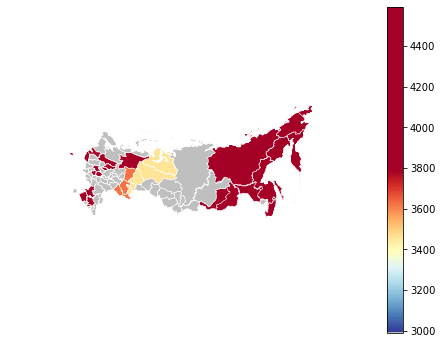

In [400]:
gplt.choropleth(
    russia_data, hue=colnameee,
    cmap=rbcmp, linewidth=0.5, edgecolor='white', k=None, legend=True,  #legend_kwargs={'size':3},
    projection=proj
);

In [303]:
# russia_data_2['Выход светлых нефтепродуктов, %'][russia_data_2['Выход светлых нефтепродуктов, %']<60]

In [232]:
russia_data_2[colnameee][russia_data_2[colnameee] > 19000] 
# = 19000

Series([], Name: Спарк-спред 2012, dtype: float64)

In [387]:
russia_data_2[colnameee][russia_data_2[colnameee] < 15000] = 15000

/home/xenakas/anaconda3/envs/geoplots3.6/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [401]:
m1 = russia_data_2[colnameee].max()
m0 = russia_data_2[colnameee].min()
m05 = (m1+m0)/2

In [402]:
m0, m05,  m1

(2988.9950000000013, 3791.010000000001, 4593.0250000000015)

In [410]:
(30+46)/2

38.0

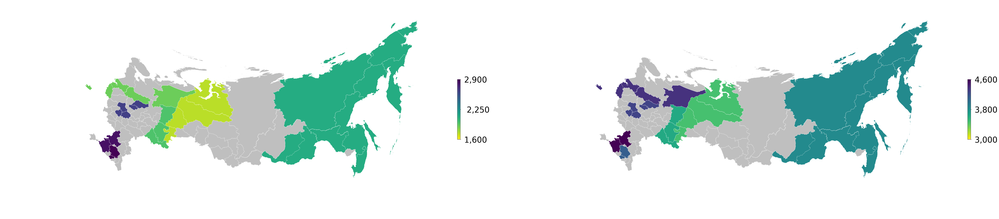

In [412]:
proj = gcrs.AlbersEqualArea(central_longitude=94, central_latitude=60)

f, axarr = plt.subplots(1, 2, figsize=(100, 20), subplot_kw={
    'projection': proj
})

f.subplots_adjust(wspace=-0.15)

gplt.choropleth(
    russia_data_3, hue='Спарк-спред 2012',
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  
    projection=proj,  ax=axarr[0]
)

sm = plt.cm.ScalarMappable(cmap=newcmp)
sm._A = []

cbar = plt.colorbar(sm, ax=axarr[0], fraction=0.005, pad = -0.05, ticks=[0, 0.5, 1]) #orientation='horizontal',
cbar.ax.set_yticklabels([' 1,600', '  2,250', ' 2,900'])  
# cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
cbar.ax.tick_params(labelsize=40)



gplt.choropleth(
    russia_data_3, hue='Спарк-спред 2018',
    cmap=newcmp, linewidth=0.5, edgecolor='white', k=None,  legend = False,  #legend_kwargs={'size':3},
    projection=proj,  ax=axarr[1] 
    
)





sm = plt.cm.ScalarMappable(cmap=newcmp)
sm._A = []

cbar = plt.colorbar(sm, ax=axarr[1], fraction=0.005, pad = -0.05, ticks=[0, 0.5, 1]) #orientation='horizontal',
cbar.ax.set_yticklabels([' 3,000', ' 3,800', ' 4,600'])  
# cbar.set_label(r'$\zeta\ [s^{-1}]$', fontsize=16)
cbar.ax.tick_params(labelsize=40);
